In [1]:
!pip install scikit-learn

In [2]:
!pip install xgboost

In [3]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [52]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.model_selection import train_test_split

In [53]:
df0= pd.read_csv("hypertension dataset-raw data.csv")
df0

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,Normal,6.4,25.8,NaN,Yes,Low,Non-Smoker,Yes
1,32,11.7,10,Normal,5.4,23.4,NaN,No,Low,Non-Smoker,No
2,78,9.5,3,Normal,7.1,18.7,NaN,No,Moderate,Non-Smoker,No
3,38,10.0,10,Hypertension,4.2,22.1,ACE Inhibitor,No,Low,Non-Smoker,Yes
4,41,9.8,1,Prehypertension,5.8,16.2,Other,No,Moderate,Non-Smoker,No
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,Normal,6.5,25.0,Diuretic,Yes,Low,Non-Smoker,Yes
1981,29,8.9,4,Hypertension,6.9,16.9,NaN,Yes,High,Non-Smoker,Yes
1982,64,5.9,9,Normal,5.6,18.9,ACE Inhibitor,Yes,Moderate,Non-Smoker,Yes
1983,35,7.4,8,Prehypertension,8.2,29.2,NaN,Yes,Moderate,Non-Smoker,No


In [54]:
df0['Medication'].unique()

array([nan, 'ACE Inhibitor', 'Other', 'Beta Blocker', 'Diuretic'],
      dtype=object)

In [55]:
df0.columns

Index(['Age', 'Salt_Intake', 'Stress_Score', 'BP_History', 'Sleep_Duration',
       'BMI', 'Medication', 'Family_History', 'Exercise_Level',
       'Smoking_Status', 'Has_Hypertension'],
      dtype='object')

In [56]:
df = df0.copy()

In [57]:
df['Has_Hypertension'] = df0['Has_Hypertension'].replace({'Yes': 1, 'No': 0})

/var/folders/x4/pjyz569s1d5by0ybzkdz1ck00000gn/T/ipykernel_31366/763273628.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Has_Hypertension'] = df0['Has_Hypertension'].replace({'Yes': 1, 'No': 0})


In [58]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,Normal,6.4,25.8,NaN,Yes,Low,Non-Smoker,1
1,32,11.7,10,Normal,5.4,23.4,NaN,No,Low,Non-Smoker,0
2,78,9.5,3,Normal,7.1,18.7,NaN,No,Moderate,Non-Smoker,0
3,38,10.0,10,Hypertension,4.2,22.1,ACE Inhibitor,No,Low,Non-Smoker,1
4,41,9.8,1,Prehypertension,5.8,16.2,Other,No,Moderate,Non-Smoker,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,Normal,6.5,25.0,Diuretic,Yes,Low,Non-Smoker,1
1981,29,8.9,4,Hypertension,6.9,16.9,NaN,Yes,High,Non-Smoker,1
1982,64,5.9,9,Normal,5.6,18.9,ACE Inhibitor,Yes,Moderate,Non-Smoker,1
1983,35,7.4,8,Prehypertension,8.2,29.2,NaN,Yes,Moderate,Non-Smoker,0


In [59]:
df0["BP_History"].unique()

array(['Normal', 'Hypertension', 'Prehypertension'], dtype=object)

In [60]:
# le = LabelEncoder()
# df['BP_History'] = le.fit_transform(df0['BP_History'])

In [61]:
df['BP_History'] = df0['BP_History'].replace({'Normal': 0, 'Prehypertension': 1, 'Hypertension': 2})

/var/folders/x4/pjyz569s1d5by0ybzkdz1ck00000gn/T/ipykernel_31366/2048430689.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['BP_History'] = df0['BP_History'].replace({'Normal': 0, 'Prehypertension': 1, 'Hypertension': 2})


In [62]:
#print(le.classes_)

In [63]:
# le.inverse_transform([0])

In [64]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,Low,Non-Smoker,1
1,32,11.7,10,0,5.4,23.4,NaN,No,Low,Non-Smoker,0
2,78,9.5,3,0,7.1,18.7,NaN,No,Moderate,Non-Smoker,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,Low,Non-Smoker,1
4,41,9.8,1,1,5.8,16.2,Other,No,Moderate,Non-Smoker,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,Diuretic,Yes,Low,Non-Smoker,1
1981,29,8.9,4,2,6.9,16.9,NaN,Yes,High,Non-Smoker,1
1982,64,5.9,9,0,5.6,18.9,ACE Inhibitor,Yes,Moderate,Non-Smoker,1
1983,35,7.4,8,1,8.2,29.2,NaN,Yes,Moderate,Non-Smoker,0


In [65]:
df0["Smoking_Status"].unique()

array(['Non-Smoker', 'Smoker'], dtype=object)

In [66]:
df["Smoking_Status"] = df0["Smoking_Status"].replace({'Smoker': 1, 'Non-Smoker': 0})
df

/var/folders/x4/pjyz569s1d5by0ybzkdz1ck00000gn/T/ipykernel_31366/1176403684.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["Smoking_Status"] = df0["Smoking_Status"].replace({'Smoker': 1, 'Non-Smoker': 0})


,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,Low,0,1
1,32,11.7,10,0,5.4,23.4,NaN,No,Low,0,0
2,78,9.5,3,0,7.1,18.7,NaN,No,Moderate,0,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,Low,0,1
4,41,9.8,1,1,5.8,16.2,Other,No,Moderate,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,Diuretic,Yes,Low,0,1
1981,29,8.9,4,2,6.9,16.9,NaN,Yes,High,0,1
1982,64,5.9,9,0,5.6,18.9,ACE Inhibitor,Yes,Moderate,0,1
1983,35,7.4,8,1,8.2,29.2,NaN,Yes,Moderate,0,0


In [67]:
df.head(20)

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,Low,0,1
1,32,11.7,10,0,5.4,23.4,NaN,No,Low,0,0
2,78,9.5,3,0,7.1,18.7,NaN,No,Moderate,0,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,Low,0,1
4,41,9.8,1,1,5.8,16.2,Other,No,Moderate,0,0
5,20,10.8,3,2,5.2,21.9,Beta Blocker,Yes,High,0,1
6,39,8.9,0,0,7.8,27.6,Beta Blocker,Yes,High,0,0
7,70,5.9,1,2,7.2,25.8,NaN,No,Moderate,0,1
8,19,9.3,7,0,4.7,36.5,Beta Blocker,Yes,Low,1,1
9,47,7.2,5,0,6.2,24.3,NaN,No,High,0,0


In [68]:
df0["Exercise_Level"].unique()

array(['Low', 'Moderate', 'High'], dtype=object)

In [69]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,Low,0,1
1,32,11.7,10,0,5.4,23.4,NaN,No,Low,0,0
2,78,9.5,3,0,7.1,18.7,NaN,No,Moderate,0,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,Low,0,1
4,41,9.8,1,1,5.8,16.2,Other,No,Moderate,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,Diuretic,Yes,Low,0,1
1981,29,8.9,4,2,6.9,16.9,NaN,Yes,High,0,1
1982,64,5.9,9,0,5.6,18.9,ACE Inhibitor,Yes,Moderate,0,1
1983,35,7.4,8,1,8.2,29.2,NaN,Yes,Moderate,0,0


In [70]:
df["Exercise_Level"] = df0["Exercise_Level"].replace({'Low': 0, 'Moderate': 1, 'High': 2})

/var/folders/x4/pjyz569s1d5by0ybzkdz1ck00000gn/T/ipykernel_31366/222670981.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["Exercise_Level"] = df0["Exercise_Level"].replace({'Low': 0, 'Moderate': 1, 'High': 2})


In [71]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,0,0,1
1,32,11.7,10,0,5.4,23.4,NaN,No,0,0,0
2,78,9.5,3,0,7.1,18.7,NaN,No,1,0,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,0,0,1
4,41,9.8,1,1,5.8,16.2,Other,No,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,Diuretic,Yes,0,0,1
1981,29,8.9,4,2,6.9,16.9,NaN,Yes,2,0,1
1982,64,5.9,9,0,5.6,18.9,ACE Inhibitor,Yes,1,0,1
1983,35,7.4,8,1,8.2,29.2,NaN,Yes,1,0,0


In [72]:
df["Medication"].unique()

array([nan, 'ACE Inhibitor', 'Other', 'Beta Blocker', 'Diuretic'],
      dtype=object)

In [73]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,NaN,Yes,0,0,1
1,32,11.7,10,0,5.4,23.4,NaN,No,0,0,0
2,78,9.5,3,0,7.1,18.7,NaN,No,1,0,0
3,38,10.0,10,2,4.2,22.1,ACE Inhibitor,No,0,0,1
4,41,9.8,1,1,5.8,16.2,Other,No,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,Diuretic,Yes,0,0,1
1981,29,8.9,4,2,6.9,16.9,NaN,Yes,2,0,1
1982,64,5.9,9,0,5.6,18.9,ACE Inhibitor,Yes,1,0,1
1983,35,7.4,8,1,8.2,29.2,NaN,Yes,1,0,0


In [74]:
df["Medication"] = df0["Medication"].map({
    'ACE Inhibitor': 1,
    'Other': 2,
    'Beta Blocker': 3,
    'Diuretic': 4
}).fillna(0).astype("Int64")

In [75]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,0,Yes,0,0,1
1,32,11.7,10,0,5.4,23.4,0,No,0,0,0
2,78,9.5,3,0,7.1,18.7,0,No,1,0,0
3,38,10.0,10,2,4.2,22.1,1,No,0,0,1
4,41,9.8,1,1,5.8,16.2,2,No,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,4,Yes,0,0,1
1981,29,8.9,4,2,6.9,16.9,0,Yes,2,0,1
1982,64,5.9,9,0,5.6,18.9,1,Yes,1,0,1
1983,35,7.4,8,1,8.2,29.2,0,Yes,1,0,0


In [76]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,0,Yes,0,0,1
1,32,11.7,10,0,5.4,23.4,0,No,0,0,0
2,78,9.5,3,0,7.1,18.7,0,No,1,0,0
3,38,10.0,10,2,4.2,22.1,1,No,0,0,1
4,41,9.8,1,1,5.8,16.2,2,No,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,4,Yes,0,0,1
1981,29,8.9,4,2,6.9,16.9,0,Yes,2,0,1
1982,64,5.9,9,0,5.6,18.9,1,Yes,1,0,1
1983,35,7.4,8,1,8.2,29.2,0,Yes,1,0,0


In [77]:
df["Family_History"] = df0["Family_History"].map({'Yes': 1, 'No': 0})

In [78]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,69,8.0,9,0,6.4,25.8,0,1,0,0,1
1,32,11.7,10,0,5.4,23.4,0,0,0,0,0
2,78,9.5,3,0,7.1,18.7,0,0,1,0,0
3,38,10.0,10,2,4.2,22.1,1,0,0,0,1
4,41,9.8,1,1,5.8,16.2,2,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,56,10.2,0,0,6.5,25.0,4,1,0,0,1
1981,29,8.9,4,2,6.9,16.9,0,1,2,0,1
1982,64,5.9,9,0,5.6,18.9,1,1,1,0,1
1983,35,7.4,8,1,8.2,29.2,0,1,1,0,0


In [79]:
df.dtypes

Age                   int64
Salt_Intake         float64
Stress_Score          int64
BP_History            int64
Sleep_Duration      float64
BMI                 float64
Medication            Int64
Family_History        int64
Exercise_Level        int64
Smoking_Status        int64
Has_Hypertension      int64
dtype: object

In [80]:
[col for col in df.columns if col != 'Has_Hypertension']

['Age',
 'Salt_Intake',
 'Stress_Score',
 'BP_History',
 'Sleep_Duration',
 'BMI',
 'Medication',
 'Family_History',
 'Exercise_Level',
 'Smoking_Status']

In [81]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
cols = [col for col in df.columns if col != 'Has_Hypertension']
df[cols] = scaler.fit_transform(df[cols])

In [82]:
df

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status,Has_Hypertension
0,0.959963,-0.266590,1.279847,-1.078305,-0.033883,-0.047723,-0.999910,1.007585,-0.941947,-0.633125,1
1,-0.943609,1.588600,1.598165,-1.078305,-0.682468,-0.579671,-0.999910,-0.992472,-0.941947,-0.633125,0
2,1.422994,0.485514,-0.630061,-1.078305,0.420126,-1.621403,-0.999910,-0.992472,0.356501,-0.633125,0
3,-0.634921,0.736216,1.598165,1.356775,-1.460769,-0.867810,-0.327317,-0.992472,-0.941947,-0.633125,1
4,-0.480578,0.635935,-1.266698,0.139235,-0.423034,-2.175515,0.345275,-0.992472,0.356501,-0.633125,0
...,...,...,...,...,...,...,...,...,...,...,...
1980,0.291141,0.836496,-1.585016,-1.078305,0.030975,-0.225039,1.690461,1.007585,-0.941947,-0.633125,1
1981,-1.097952,0.184673,-0.311743,1.356775,0.290409,-2.020364,-0.999910,1.007585,1.654949,-0.633125,1
1982,0.702724,-1.319535,1.279847,-1.078305,-0.552751,-1.577074,-0.327317,1.007585,0.356501,-0.633125,1
1983,-0.789265,-0.567431,0.961529,0.139235,1.133569,0.705869,-0.999910,1.007585,0.356501,-0.633125,0


In [83]:
target = 'Has_Hypertension'
x = df.drop(columns=[target])
y = df[target]

In [84]:
x

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
0,0.959963,-0.266590,1.279847,-1.078305,-0.033883,-0.047723,-0.999910,1.007585,-0.941947,-0.633125
1,-0.943609,1.588600,1.598165,-1.078305,-0.682468,-0.579671,-0.999910,-0.992472,-0.941947,-0.633125
2,1.422994,0.485514,-0.630061,-1.078305,0.420126,-1.621403,-0.999910,-0.992472,0.356501,-0.633125
3,-0.634921,0.736216,1.598165,1.356775,-1.460769,-0.867810,-0.327317,-0.992472,-0.941947,-0.633125
4,-0.480578,0.635935,-1.266698,0.139235,-0.423034,-2.175515,0.345275,-0.992472,0.356501,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1980,0.291141,0.836496,-1.585016,-1.078305,0.030975,-0.225039,1.690461,1.007585,-0.941947,-0.633125
1981,-1.097952,0.184673,-0.311743,1.356775,0.290409,-2.020364,-0.999910,1.007585,1.654949,-0.633125
1982,0.702724,-1.319535,1.279847,-1.078305,-0.552751,-1.577074,-0.327317,1.007585,0.356501,-0.633125
1983,-0.789265,-0.567431,0.961529,0.139235,1.133569,0.705869,-0.999910,1.007585,0.356501,-0.633125


In [85]:
y

0       1
1       0
2       0
3       1
4       0
       ..
1980    1
1981    1
1982    1
1983    0
1984    0
Name: Has_Hypertension, Length: 1985, dtype: int64

In [86]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [87]:
x_train

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
721,-0.377682,-0.316730,0.961529,-1.078305,-0.487892,0.306909,1.017868,-0.992472,0.356501,1.579468
480,-1.046504,-0.818133,0.006575,-1.078305,-2.563363,0.462060,-0.999910,1.007585,-0.941947,-0.633125
567,-0.840713,-0.316730,0.006575,0.139235,0.484984,0.351238,-0.999910,1.007585,0.356501,-0.633125
71,-0.943609,0.936777,1.279847,0.139235,1.003852,0.306909,-0.999910,1.007585,0.356501,1.579468
628,0.857067,0.234813,0.961529,1.356775,0.744418,-0.069888,1.690461,-0.992472,-0.941947,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1130,-0.892161,-1.018694,-0.630061,1.356775,0.679560,-0.734823,-0.999910,1.007585,1.654949,-0.633125
1294,0.291141,1.237618,-0.311743,1.356775,1.198428,0.883185,-0.999910,-0.992472,-0.941947,-0.633125
860,-0.532026,0.385234,0.961529,1.356775,-0.617609,0.572882,-0.999910,1.007585,-0.941947,-0.633125
1459,0.342589,3.945193,0.324893,1.356775,-0.682468,-1.554909,-0.999910,1.007585,-0.941947,1.579468


In [88]:
x_test

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
582,-1.097952,0.635935,1.279847,0.139235,0.938994,0.351238,-0.999910,-0.992472,1.654949,1.579468
1711,-1.612431,-0.717852,-1.585016,-1.078305,-0.941902,-0.779152,1.017868,1.007585,0.356501,-0.633125
1052,0.496932,0.034252,-0.311743,1.356775,0.030975,-0.734823,1.690461,1.007585,-0.941947,-0.633125
1075,-1.097952,0.535655,-0.630061,-1.078305,-0.358176,1.259982,-0.999910,-0.992472,-0.941947,-0.633125
917,0.805619,-1.369676,1.279847,-1.078305,0.095834,-0.047723,-0.999910,-0.992472,0.356501,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1488,-1.149400,0.084392,0.961529,-1.078305,1.068711,0.994008,1.690461,-0.992472,-0.941947,1.579468
365,0.959963,-0.066029,-1.585016,1.356775,1.782154,-0.069888,-0.999910,1.007585,-0.941947,-0.633125
1000,-0.789265,-0.166309,0.006575,1.356775,0.225551,0.816692,-0.999910,1.007585,-0.941947,-0.633125
1230,0.445484,0.836496,0.324893,0.139235,0.095834,0.373402,-0.999910,1.007585,0.356501,-0.633125


In [89]:
y_train

721     0
480     0
567     0
71      1
628     1
       ..
1130    1
1294    1
860     1
1459    1
1126    1
Name: Has_Hypertension, Length: 1588, dtype: int64

In [90]:
y_test

582     0
1711    0
1052    1
1075    0
917     0
       ..
1488    1
365     1
1000    1
1230    1
588     1
Name: Has_Hypertension, Length: 397, dtype: int64

In [91]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix

In [92]:
x_train

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
721,-0.377682,-0.316730,0.961529,-1.078305,-0.487892,0.306909,1.017868,-0.992472,0.356501,1.579468
480,-1.046504,-0.818133,0.006575,-1.078305,-2.563363,0.462060,-0.999910,1.007585,-0.941947,-0.633125
567,-0.840713,-0.316730,0.006575,0.139235,0.484984,0.351238,-0.999910,1.007585,0.356501,-0.633125
71,-0.943609,0.936777,1.279847,0.139235,1.003852,0.306909,-0.999910,1.007585,0.356501,1.579468
628,0.857067,0.234813,0.961529,1.356775,0.744418,-0.069888,1.690461,-0.992472,-0.941947,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1130,-0.892161,-1.018694,-0.630061,1.356775,0.679560,-0.734823,-0.999910,1.007585,1.654949,-0.633125
1294,0.291141,1.237618,-0.311743,1.356775,1.198428,0.883185,-0.999910,-0.992472,-0.941947,-0.633125
860,-0.532026,0.385234,0.961529,1.356775,-0.617609,0.572882,-0.999910,1.007585,-0.941947,-0.633125
1459,0.342589,3.945193,0.324893,1.356775,-0.682468,-1.554909,-0.999910,1.007585,-0.941947,1.579468


In [93]:
y_train

721     0
480     0
567     0
71      1
628     1
       ..
1130    1
1294    1
860     1
1459    1
1126    1
Name: Has_Hypertension, Length: 1588, dtype: int64

In [94]:
x_test

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
582,-1.097952,0.635935,1.279847,0.139235,0.938994,0.351238,-0.999910,-0.992472,1.654949,1.579468
1711,-1.612431,-0.717852,-1.585016,-1.078305,-0.941902,-0.779152,1.017868,1.007585,0.356501,-0.633125
1052,0.496932,0.034252,-0.311743,1.356775,0.030975,-0.734823,1.690461,1.007585,-0.941947,-0.633125
1075,-1.097952,0.535655,-0.630061,-1.078305,-0.358176,1.259982,-0.999910,-0.992472,-0.941947,-0.633125
917,0.805619,-1.369676,1.279847,-1.078305,0.095834,-0.047723,-0.999910,-0.992472,0.356501,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1488,-1.149400,0.084392,0.961529,-1.078305,1.068711,0.994008,1.690461,-0.992472,-0.941947,1.579468
365,0.959963,-0.066029,-1.585016,1.356775,1.782154,-0.069888,-0.999910,1.007585,-0.941947,-0.633125
1000,-0.789265,-0.166309,0.006575,1.356775,0.225551,0.816692,-0.999910,1.007585,-0.941947,-0.633125
1230,0.445484,0.836496,0.324893,0.139235,0.095834,0.373402,-0.999910,1.007585,0.356501,-0.633125


In [95]:
y_test

582     0
1711    0
1052    1
1075    0
917     0
       ..
1488    1
365     1
1000    1
1230    1
588     1
Name: Has_Hypertension, Length: 397, dtype: int64

In [96]:
# 2. Create and train model
model = LogisticRegression()
model.fit(x_train, y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [97]:
y_train_pred = model.predict(x_train)
y_train_pred

array([0, 0, 0, ..., 1, 1, 1], shape=(1588,))

In [98]:
mesure_LR_train= accuracy_score(y_train, y_train_pred)
mesure_LR_train

0.8287153652392947

In [103]:
# 4. Evaluate
mesure_LR= accuracy_score(y_test, y_pred)
print("Accuracy:", mesure_LR)

Accuracy: 0.8312342569269522


In [100]:
# 2. Create and train a model
model = LogisticRegression()
model.fit(x_train, y_train)

# 3. Predict
y_pred = model.predict(x_test)

# 4. Evaluate
mesure_LR= accuracy_score(y_test, y_pred)
print("Accuracy:", mesure_LR)

Accuracy: 0.8312342569269522


In [101]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Confusion Matrix:
 [[156  36]
 [ 31 174]]


In [102]:
y_test.shape

(397,)

In [104]:
x_test

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
582,-1.097952,0.635935,1.279847,0.139235,0.938994,0.351238,-0.999910,-0.992472,1.654949,1.579468
1711,-1.612431,-0.717852,-1.585016,-1.078305,-0.941902,-0.779152,1.017868,1.007585,0.356501,-0.633125
1052,0.496932,0.034252,-0.311743,1.356775,0.030975,-0.734823,1.690461,1.007585,-0.941947,-0.633125
1075,-1.097952,0.535655,-0.630061,-1.078305,-0.358176,1.259982,-0.999910,-0.992472,-0.941947,-0.633125
917,0.805619,-1.369676,1.279847,-1.078305,0.095834,-0.047723,-0.999910,-0.992472,0.356501,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1488,-1.149400,0.084392,0.961529,-1.078305,1.068711,0.994008,1.690461,-0.992472,-0.941947,1.579468
365,0.959963,-0.066029,-1.585016,1.356775,1.782154,-0.069888,-0.999910,1.007585,-0.941947,-0.633125
1000,-0.789265,-0.166309,0.006575,1.356775,0.225551,0.816692,-0.999910,1.007585,-0.941947,-0.633125
1230,0.445484,0.836496,0.324893,0.139235,0.095834,0.373402,-0.999910,1.007585,0.356501,-0.633125


In [105]:
x_test[3:4]

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
1075,-1.097952,0.535655,-0.630061,-1.078305,-0.358176,1.259982,-0.99991,-0.992472,-0.941947,-0.633125


In [106]:
x_test.iloc[3]

Age              -1.097952
Salt_Intake       0.535655
Stress_Score     -0.630061
BP_History       -1.078305
Sleep_Duration   -0.358176
BMI               1.259982
Medication       -0.999910
Family_History   -0.992472
Exercise_Level   -0.941947
Smoking_Status   -0.633125
Name: 1075, dtype: float64

In [107]:
type(x_test)

pandas.core.frame.DataFrame

In [108]:
type(x_test.iloc[3].to_frame())

pandas.core.frame.DataFrame

In [109]:
model.predict([x_test.iloc[3]])

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


array([0])

In [110]:
y_test.iloc[3]

np.int64(0)

In [111]:

from sklearn.neighbors import KNeighborsClassifier


In [112]:
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn.fit(x_train, y_train)

,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [113]:
y_pred = knn.predict(x_test)
mesure_knn= accuracy_score(y_test, y_pred)
print("Accuracy:", mesure_knn)

Accuracy: 0.8690176322418136


In [114]:
from sklearn.svm import SVC

In [115]:
svm_classifier = SVC(kernel='rbf', random_state=42)
svm_classifier.fit(x_train, y_train)

,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


In [116]:
y_pred = svm_classifier.predict(x_test)
mesures_svm = accuracy_score(y_test, y_pred)
print("SVM Accuracy:", mesures_svm)

SVM Accuracy: 0.8992443324937027


In [117]:
svc_model = SVC(kernel="rbf", C=1.0, gamma="scale")
svc_model.fit(x_train, y_train)

,C,1.0
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,False
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


In [118]:
y_pred = svc_model.predict(x_test)
mesures_svc = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_svc)

Accuracy: 0.8992443324937027


In [119]:
from sklearn.tree import DecisionTreeClassifier

In [120]:
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(x_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [121]:
y_pred = dt_classifier.predict(x_test)
mesures_tree = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_tree)

Accuracy: 0.9596977329974811


In [122]:
from sklearn.ensemble import RandomForestClassifier

In [123]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [124]:
y_pred = rf_classifier.predict(x_test)
mesures_forest = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy:", mesures_forest)

Random Forest Accuracy: 0.9672544080604534


In [125]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)

param_grid = {
    "n_estimators": [50, 100, 200],
    "max_depth": [None, 5, 10, 20],
    "min_samples_split": [2, 5, 10]
}

grid = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(x_train, y_train)

print("Best params:", grid.best_params_)
print("Best score:", grid.best_score_)

Best params: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 100}
Best score: 0.9647203539471857


In [126]:
# Predict with the best model found by GridSearch
best_model = grid.best_estimator_
y_pred = best_model.predict(x_test)

# Calculate your accuracy
mesures_tree = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_tree)

Accuracy: 0.9622166246851386


In [127]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

In [128]:
gb_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
gb_classifier.fit(x_train, y_train)

,loss,'log_loss'
,learning_rate,0.1
,n_estimators,100
,subsample,1.0
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,3
,min_impurity_decrease,0.0
,init,None


In [129]:
y_pred = gb_classifier.predict(x_test)
mesures_gb = accuracy_score(y_test, y_pred)
print("Gradient Boosting Accuracy:", mesures_gb)

Gradient Boosting Accuracy: 0.9874055415617129


In [130]:
from sklearn.ensemble import AdaBoostClassifier

In [131]:
ada_model = AdaBoostClassifier(
    n_estimators=50,   # number of weak learners
    learning_rate=1,  # step size
    random_state=42
)
ada_model.fit(x_train, y_train)

,estimator,None
,n_estimators,50
,learning_rate,1
,algorithm,'deprecated'
,random_state,42


In [132]:
y_pred = ada_model.predict(x_test)
mesures_ab = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_ab)

Accuracy: 1.0


In [188]:
import numpy as np
import pandas as pd

# Extract class 1
shap_class_1 = shap_values_ada[:, :, 1]

print(f"Extracted shape: {shap_class_1.shape}")
print(f"Sum |SHAP|: {np.sum(np.abs(shap_class_1)):.2f}")
print(f"Min: {np.min(shap_class_1):.6f}")
print(f"Max: {np.max(shap_class_1):.6f}")

# Show actual values
print("\nFirst sample SHAP values:")
print(pd.DataFrame({
    'Feature': test_subset.columns,
    'SHAP': shap_class_1[0]
}).sort_values('SHAP', key=abs, ascending=False))

# Calculate mean importance
importance = np.abs(shap_class_1).mean(axis=0)
print("\nMean |SHAP| per feature:")
print(pd.DataFrame({
    'Feature': test_subset.columns,
    'Importance': importance
}).sort_values('Importance', ascending=False))

Extracted shape: (50, 10)
Sum |SHAP|: 13.11
Min: -0.057376
Max: 0.110987

First sample SHAP values:
          Feature      SHAP
3      BP_History -0.057069
2    Stress_Score  0.052820
9  Smoking_Status  0.051567
7  Family_History -0.049086
0             Age -0.037517
1     Salt_Intake -0.015477
5             BMI -0.013409
4  Sleep_Duration -0.012237
6      Medication  0.000000
8  Exercise_Level  0.000000

Mean |SHAP| per feature:
          Feature  Importance
3      BP_History    0.068419
7  Family_History    0.044419
0             Age    0.036424
9  Smoking_Status    0.031006
2    Stress_Score    0.024626
1     Salt_Intake    0.022380
5             BMI    0.018389
4  Sleep_Duration    0.016478
6      Medication    0.000000
8  Exercise_Level    0.000000


In [173]:
import shap
import matplotlib.pyplot as plt
shap.initjs()

COMPREHENSIVE SHAP PLOT DIAGNOSTIC

[STEP 1] Verifying data...
SHAP shape: (50, 10)
Test data shape: (50, 10)
Sum |SHAP|: 13.11
Min SHAP: -0.057376
Max SHAP: 0.110987
✓ SHAP values look valid

[STEP 2] Checking matplotlib...
Backend: module://matplotlib_inline.backend_inline
   Using inline backend (Jupyter)

[STEP 3] Method 1: SHAP summary_plot with show=False...


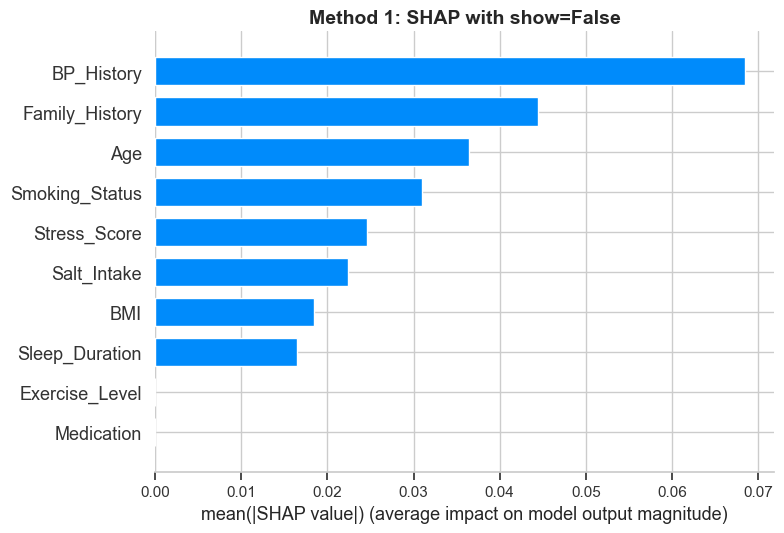

   ✓ Method 1 complete

[STEP 4] Method 2: SHAP summary_plot (default show)...


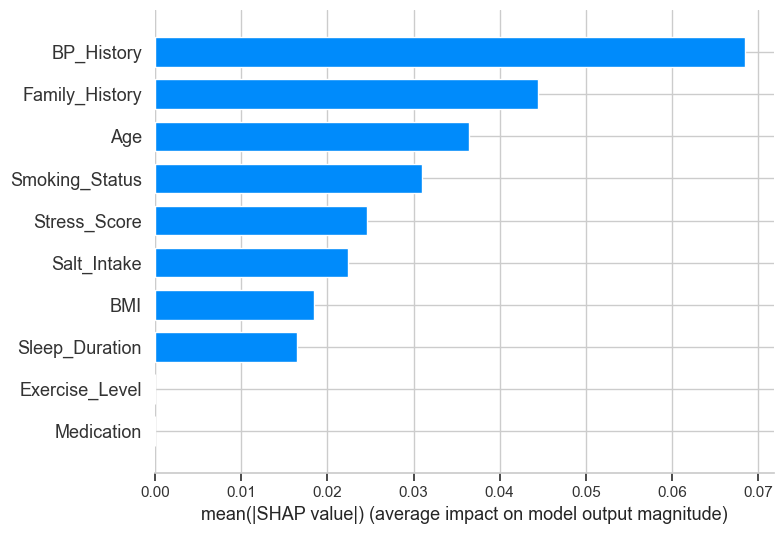

   ✓ Method 2 complete (title may be missing)

[STEP 5] Method 3: Manual matplotlib bar chart...


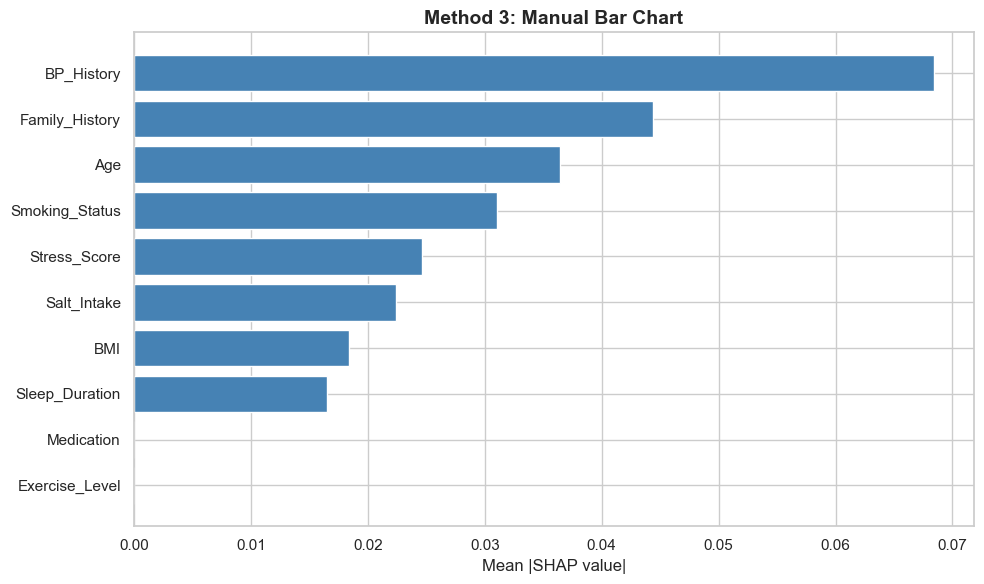

   ✓ Method 3 complete

[STEP 6] Method 4: Seaborn bar plot...


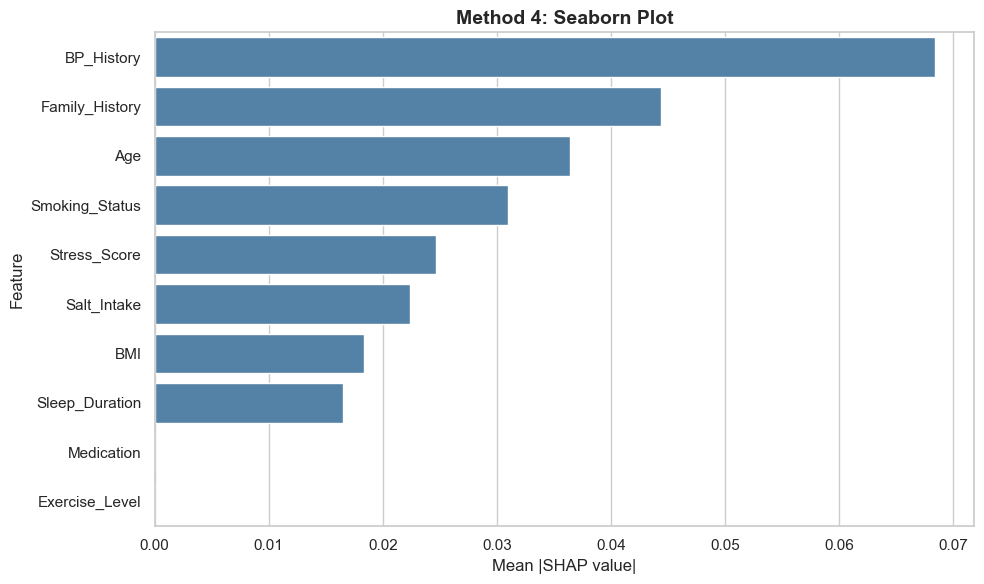

   ✓ Method 4 complete

[STEP 7] Feature importance table...

TOP 10 FEATURES (from SHAP values)
       Feature  Importance
    BP_History    0.068419
Family_History    0.044419
           Age    0.036424
Smoking_Status    0.031006
  Stress_Score    0.024626
   Salt_Intake    0.022380
           BMI    0.018389
Sleep_Duration    0.016478
    Medication    0.000000
Exercise_Level    0.000000

SAMPLE #0 SHAP VALUES
       Feature  SHAP_Value
    BP_History   -0.057069
  Stress_Score    0.052820
Smoking_Status    0.051567
Family_History   -0.049086
           Age   -0.037517
   Salt_Intake   -0.015477
           BMI   -0.013409
Sleep_Duration   -0.012237
    Medication    0.000000
Exercise_Level    0.000000

DIAGNOSIS
✓ SHAP values exist (sum = 13.11)

🔍 Which method(s) showed bars?
   - If Method 1 or 2 worked: Use that code
   - If only Method 3 or 4 worked: Possible SHAP plotting bug
   - If NONE worked: Matplotlib backend or display issue

💡 Recommendation:
   1. If running in Jupyter

In [190]:
print("="*70)
print("COMPREHENSIVE SHAP PLOT DIAGNOSTIC")
print("="*70)

# =============================================================================
# STEP 1: Verify Data
# =============================================================================
print("\n[STEP 1] Verifying data...")

shap_class_1 = shap_values_ada[:, :, 1]

print(f"SHAP shape: {shap_class_1.shape}")
print(f"Test data shape: {test_subset.shape}")
print(f"Sum |SHAP|: {np.sum(np.abs(shap_class_1)):.2f}")
print(f"Min SHAP: {np.min(shap_class_1):.6f}")
print(f"Max SHAP: {np.max(shap_class_1):.6f}")

if np.sum(np.abs(shap_class_1)) < 0.001:
    print("❌ ERROR: SHAP values are essentially zero!")
    print("   Cannot create meaningful plots.")
else:
    print("✓ SHAP values look valid")

# =============================================================================
# STEP 2: Check matplotlib backend
# =============================================================================
print("\n[STEP 2] Checking matplotlib...")
print(f"Backend: {plt.get_backend()}")

# Try to ensure an interactive backend
try:
    import matplotlib
    if 'inline' in plt.get_backend().lower():
        print("   Using inline backend (Jupyter)")
    else:
        print("   Using GUI backend")
except:
    pass

# =============================================================================
# STEP 3: Try Method 1 - SHAP plot with show=False
# =============================================================================
print("\n[STEP 3] Method 1: SHAP summary_plot with show=False...")

try:
    fig, ax = plt.subplots(figsize=(10, 6))
    shap.summary_plot(
        shap_class_1, 
        test_subset, 
        plot_type="bar",
        show=False
    )
    plt.title("Method 1: SHAP with show=False", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    print("   ✓ Method 1 complete")
except Exception as e:
    print(f"   ✗ Method 1 failed: {e}")

# =============================================================================
# STEP 4: Try Method 2 - SHAP plot without show parameter
# =============================================================================
print("\n[STEP 4] Method 2: SHAP summary_plot (default show)...")

try:
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_class_1, test_subset, plot_type="bar")
    print("   ✓ Method 2 complete (title may be missing)")
except Exception as e:
    print(f"   ✗ Method 2 failed: {e}")

# =============================================================================
# STEP 5: Try Method 3 - Manual matplotlib bar chart
# =============================================================================
print("\n[STEP 5] Method 3: Manual matplotlib bar chart...")

try:
    # Calculate importance
    importance = pd.DataFrame({
        'Feature': test_subset.columns,
        'Importance': np.abs(shap_class_1).mean(axis=0)
    }).sort_values('Importance', ascending=False)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.barh(importance['Feature'], importance['Importance'], color='steelblue')
    ax.set_xlabel('Mean |SHAP value|', fontsize=12)
    ax.set_title('Method 3: Manual Bar Chart', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    plt.tight_layout()
    plt.show()
    print("   ✓ Method 3 complete")
except Exception as e:
    print(f"   ✗ Method 3 failed: {e}")

# =============================================================================
# STEP 6: Try Method 4 - Seaborn barplot
# =============================================================================
print("\n[STEP 6] Method 4: Seaborn bar plot...")

try:
    import seaborn as sns
    
    importance = pd.DataFrame({
        'Feature': test_subset.columns,
        'Importance': np.abs(shap_class_1).mean(axis=0)
    }).sort_values('Importance', ascending=False)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(
        data=importance, 
        y='Feature', 
        x='Importance',
        ax=ax,
        color='steelblue'
    )
    ax.set_xlabel('Mean |SHAP value|', fontsize=12)
    ax.set_title('Method 4: Seaborn Plot', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    print("   ✓ Method 4 complete")
except ImportError:
    print("   ⚠ Seaborn not available, skipping")
except Exception as e:
    print(f"   ✗ Method 4 failed: {e}")

# =============================================================================
# STEP 7: Print feature importance table
# =============================================================================
print("\n[STEP 7] Feature importance table...")

importance = pd.DataFrame({
    'Feature': test_subset.columns,
    'Importance': np.abs(shap_class_1).mean(axis=0)
}).sort_values('Importance', ascending=False)

print("\n" + "="*70)
print("TOP 10 FEATURES (from SHAP values)")
print("="*70)
print(importance.head(10).to_string(index=False))

# Show the first sample's SHAP values
print("\n" + "="*70)
print("SAMPLE #0 SHAP VALUES")
print("="*70)
sample_shap = pd.DataFrame({
    'Feature': test_subset.columns,
    'SHAP_Value': shap_class_1[0]
}).sort_values('SHAP_Value', key=abs, ascending=False)
print(sample_shap.to_string(index=False))

# =============================================================================
# FINAL DIAGNOSIS
# =============================================================================
print("\n" + "="*70)
print("DIAGNOSIS")
print("="*70)

if np.sum(np.abs(shap_class_1)) < 0.001:
    print("❌ Problem: SHAP values are zero or too small")
    print("   → Recalculate SHAP values from scratch")
else:
    print("✓ SHAP values exist (sum = {:.2f})".format(np.sum(np.abs(shap_class_1))))
    print("\n🔍 Which method(s) showed bars?")
    print("   - If Method 1 or 2 worked: Use that code")
    print("   - If only Method 3 or 4 worked: Possible SHAP plotting bug")
    print("   - If NONE worked: Matplotlib backend or display issue")
    print("\n💡 Recommendation:")
    print("   1. If running in Jupyter, try: %matplotlib inline")
    print("   2. Use Method 3 (manual matplotlib) as backup")
    print("   3. Check if any plots appeared above this message")

print("\n" + "="*70)
print("DIAGNOSTIC COMPLETE")
print("="*70)

In [133]:
print(confusion_matrix(y_test, y_pred))

[[192   0]
 [  0 205]]


In [134]:
from xgboost import XGBClassifier

In [135]:
xgb = XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=4,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='logloss'
)
xgb.fit(x_train, y_train)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.8
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [136]:
y_pred = xgb.predict(x_test)
mesures_xgb = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_xgb)

Accuracy: 0.9949622166246851


In [137]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report

In [138]:
mlp = MLPClassifier(
    learning_rate_init=0.001,
    hidden_layer_sizes=(128, 64),   # Two hidden layers: 64 & 32 neurons
    activation='relu',             # ReLU works very well
    solver='adam',                 # Optimization algorithm
    max_iter=500,                  # Increase if convergence warning appears
    random_state=42
)

In [139]:
mlp.fit(x_train, y_train)

,hidden_layer_sizes,"(128, ...)"
,activation,'relu'
,solver,'adam'
,alpha,0.0001
,batch_size,'auto'
,learning_rate,'constant'
,learning_rate_init,0.001
,power_t,0.5
,max_iter,500
,shuffle,True
,random_state,42


In [140]:
y_pred = mlp.predict(x_test)
mesures_MLP = accuracy_score(y_test, y_pred)
print("Accuracy:", mesures_MLP)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8967254408060453

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.89       192
           1       0.91      0.89      0.90       205

    accuracy                           0.90       397
   macro avg       0.90      0.90      0.90       397
weighted avg       0.90      0.90      0.90       397



In [141]:
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Confusion Matrix:
 [[174  18]
 [ 23 182]]


In [142]:
from sklearn.metrics import precision_score, recall_score
precision_1 = precision_score(y_test, y_pred, pos_label=1)
recall_1 = recall_score(y_test, y_pred, pos_label=1)
precision_1,recall_1

(0.91, 0.8878048780487805)

In [143]:
from sklearn.metrics import precision_score, recall_score
precision_1 = precision_score(y_test, y_pred, pos_label=0)
recall_1 = recall_score(y_test, y_pred, pos_label=0)
precision_1,recall_1

(0.883248730964467, 0.90625)

In [144]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "C": [0.01, 0.1, 1, 10, 100],
    "penalty": ["l1", "l2"],
    "solver": ["liblinear", "saga"]
}

log_reg = LogisticRegression(max_iter=5000)

grid = GridSearchCV(
    log_reg,
    param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid.fit(x_train, y_train)

print("Best params:", grid.best_params_)
print("Best CV score:", grid.best_score_)

Best params: {'C': 0.1, 'penalty': 'l1', 'solver': 'saga'}
Best CV score: 0.8293355554232884


In [145]:
y_pred = grid.best_estimator_.predict(x_test)

mesure_LR = accuracy_score(y_test, y_pred)
print("Test accuracy:", mesure_LR)

Test accuracy: 0.8261964735516373


In [146]:
dict_mesures={}
dict_mesures['accuracy of LR'] = mesure_LR
dict_mesures['accuracy knn'] = mesure_knn
dict_mesures['accuracy of svm'] = mesures_svm
dict_mesures['accuracy of svc'] = mesures_svc
dict_mesures['accuracy of tree'] = mesures_tree
dict_mesures['accuracy of forest'] = mesures_forest
dict_mesures['accuracy of gb'] = mesures_gb
dict_mesures['accuracy of ab'] = mesures_ab
dict_mesures['accuracy of xgb'] = mesures_xgb
dict_mesures['accuracy of MLP'] = mesures_MLP
dict_mesures

{'accuracy of LR': 0.8261964735516373,
 'accuracy knn': 0.8690176322418136,
 'accuracy of svm': 0.8992443324937027,
 'accuracy of svc': 0.8992443324937027,
 'accuracy of tree': 0.9622166246851386,
 'accuracy of forest': 0.9672544080604534,
 'accuracy of gb': 0.9874055415617129,
 'accuracy of ab': 1.0,
 'accuracy of xgb': 0.9949622166246851,
 'accuracy of MLP': 0.8967254408060453}

In [147]:
df_results = pd.DataFrame(sorted(dict_mesures.items(), key=lambda item: item[1], reverse=True),
                          columns=["Model", "Accuracy"])
print(df_results)

                Model  Accuracy
0      accuracy of ab  1.000000
1     accuracy of xgb  0.994962
2      accuracy of gb  0.987406
3  accuracy of forest  0.967254
4    accuracy of tree  0.962217
5     accuracy of svm  0.899244
6     accuracy of svc  0.899244
7     accuracy of MLP  0.896725
8        accuracy knn  0.869018
9      accuracy of LR  0.826196


In [148]:
x_train

,Age,Salt_Intake,Stress_Score,BP_History,Sleep_Duration,BMI,Medication,Family_History,Exercise_Level,Smoking_Status
721,-0.377682,-0.316730,0.961529,-1.078305,-0.487892,0.306909,1.017868,-0.992472,0.356501,1.579468
480,-1.046504,-0.818133,0.006575,-1.078305,-2.563363,0.462060,-0.999910,1.007585,-0.941947,-0.633125
567,-0.840713,-0.316730,0.006575,0.139235,0.484984,0.351238,-0.999910,1.007585,0.356501,-0.633125
71,-0.943609,0.936777,1.279847,0.139235,1.003852,0.306909,-0.999910,1.007585,0.356501,1.579468
628,0.857067,0.234813,0.961529,1.356775,0.744418,-0.069888,1.690461,-0.992472,-0.941947,-0.633125
...,...,...,...,...,...,...,...,...,...,...
1130,-0.892161,-1.018694,-0.630061,1.356775,0.679560,-0.734823,-0.999910,1.007585,1.654949,-0.633125
1294,0.291141,1.237618,-0.311743,1.356775,1.198428,0.883185,-0.999910,-0.992472,-0.941947,-0.633125
860,-0.532026,0.385234,0.961529,1.356775,-0.617609,0.572882,-0.999910,1.007585,-0.941947,-0.633125
1459,0.342589,3.945193,0.324893,1.356775,-0.682468,-1.554909,-0.999910,1.007585,-0.941947,1.579468


In [149]:
coef = model.coef_[0]                 # coefficients
features = x_train.columns            # feature names

importance = pd.DataFrame({
    "feature": features,
    "coef": coef,
    "abs_coef": np.abs(coef)
}).sort_values("abs_coef", ascending=False)

In [150]:
importance

,feature,coef,abs_coef
3,BP_History,1.791411,1.791411
7,Family_History,1.185759,1.185759
9,Smoking_Status,1.066807,1.066807
2,Stress_Score,0.969513,0.969513
0,Age,0.953932,0.953932
4,Sleep_Duration,-0.559559,0.559559
5,BMI,0.538788,0.538788
1,Salt_Intake,0.537544,0.537544
8,Exercise_Level,0.145190,0.145190
6,Medication,0.053815,0.053815


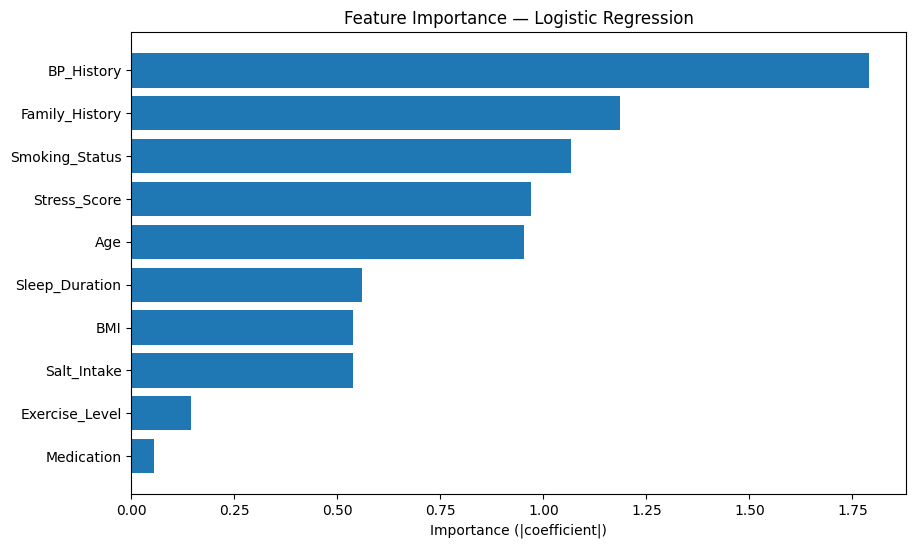

In [151]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(importance["feature"], importance["abs_coef"])
plt.xlabel("Importance (|coefficient|)")
plt.title("Feature Importance — Logistic Regression")
plt.gca().invert_yaxis()
plt.show()

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [153]:
# Set the visual style
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

In [154]:
# Select numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

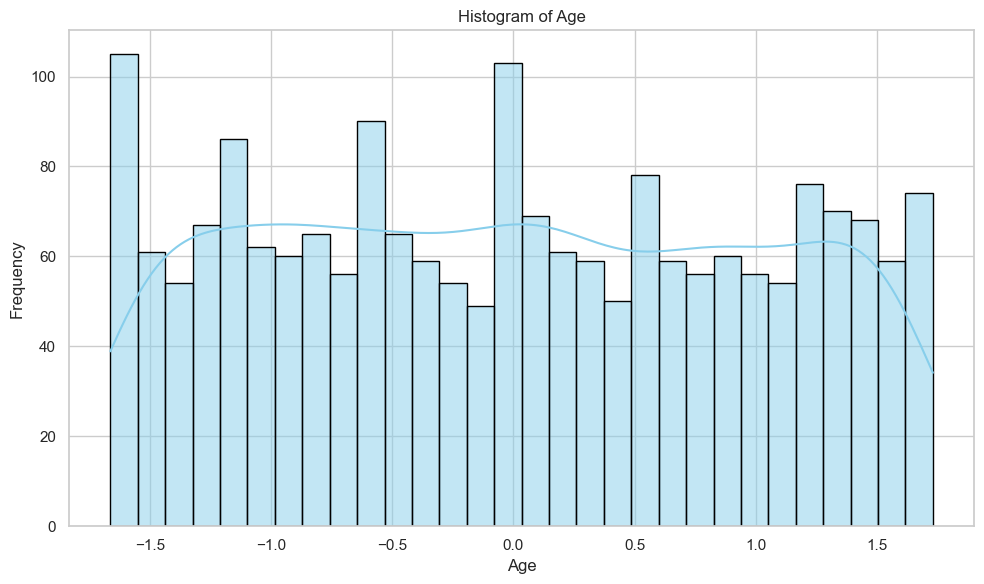

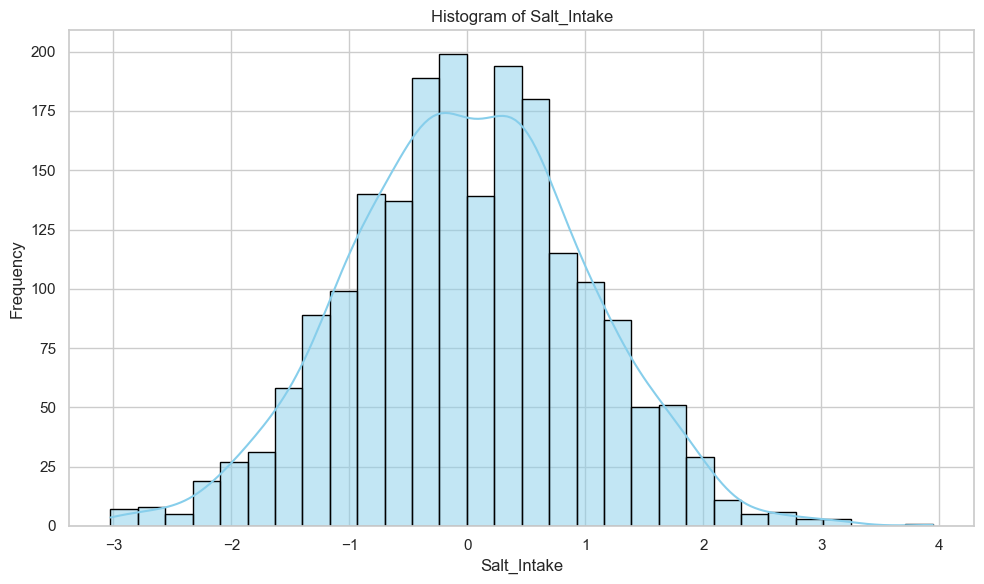

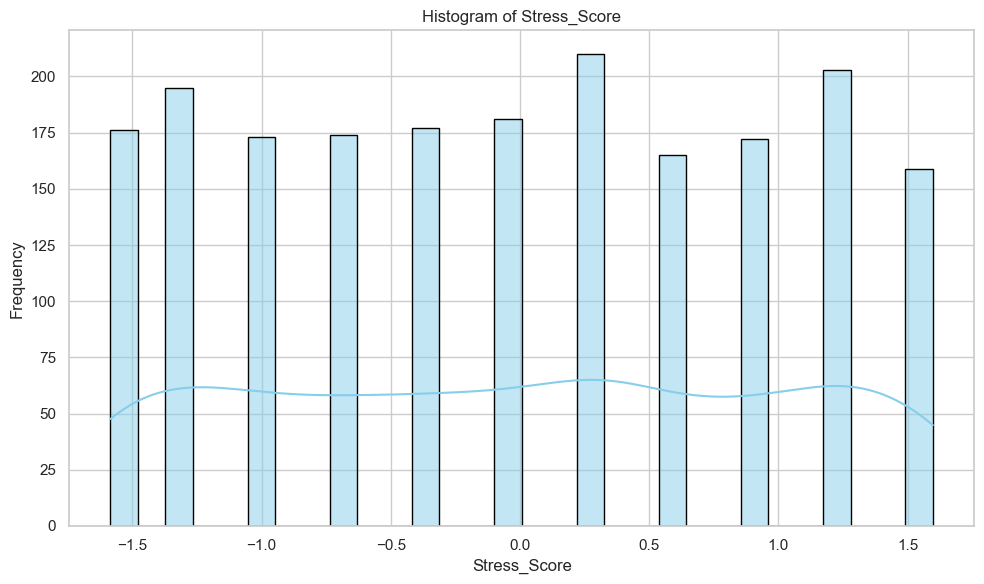

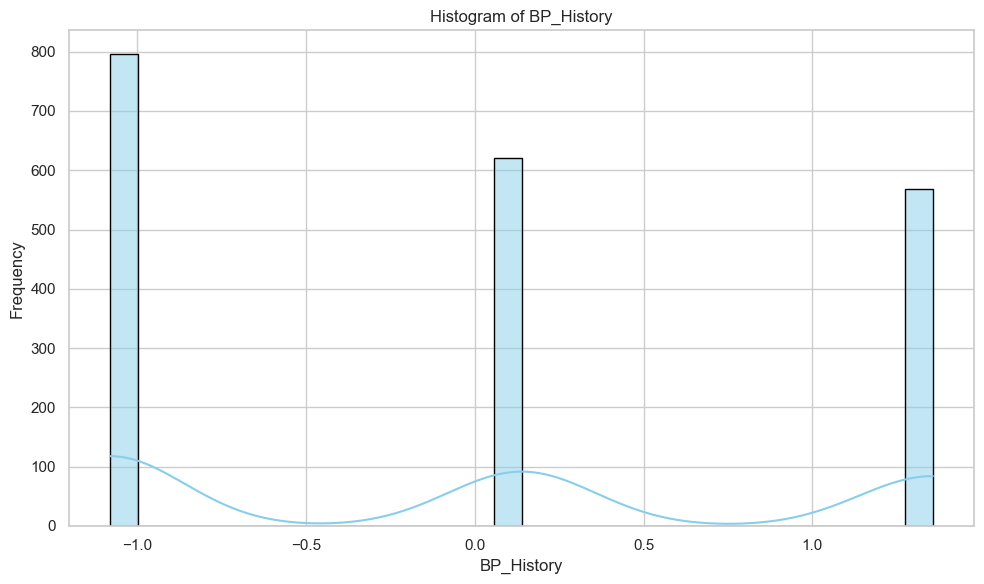

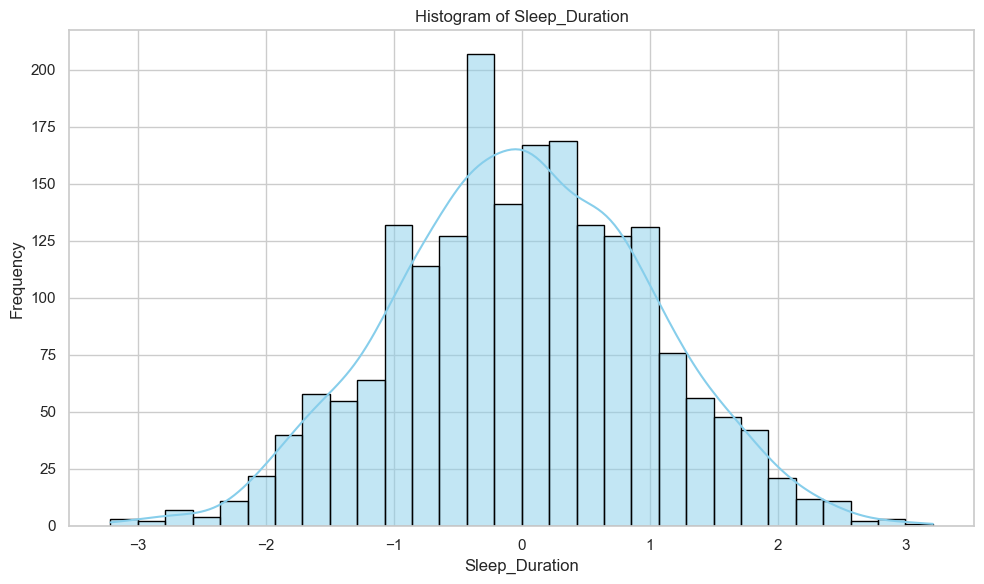

...

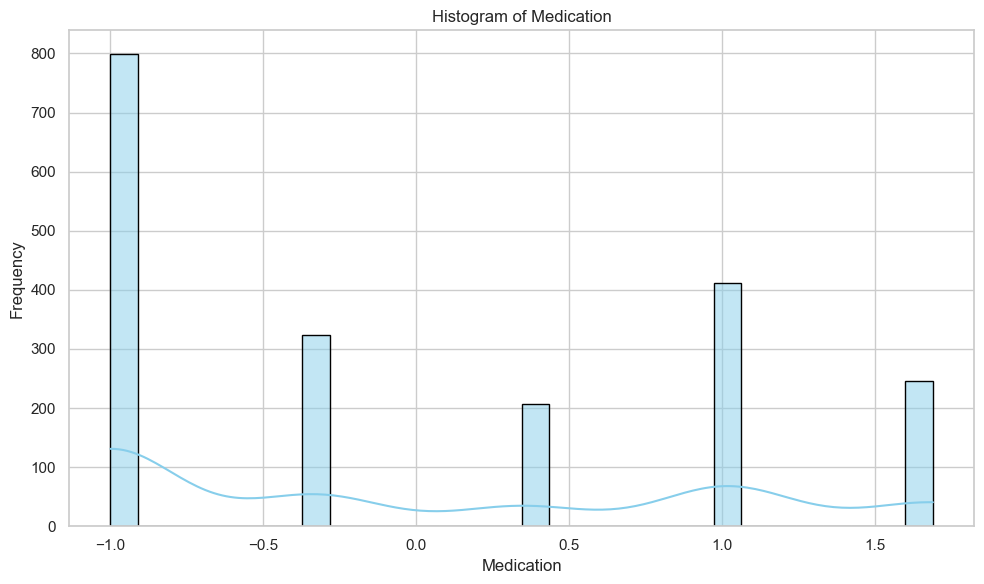

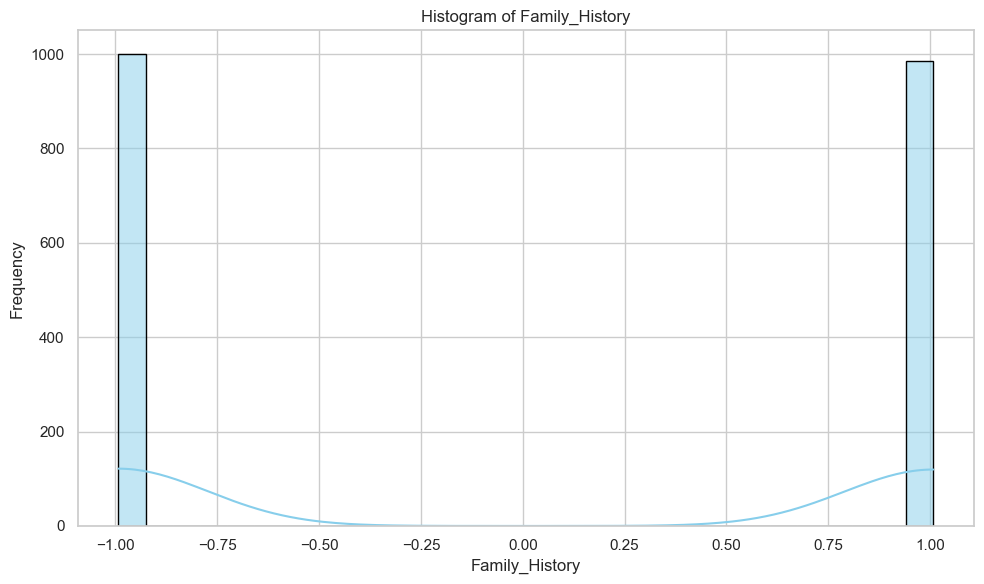

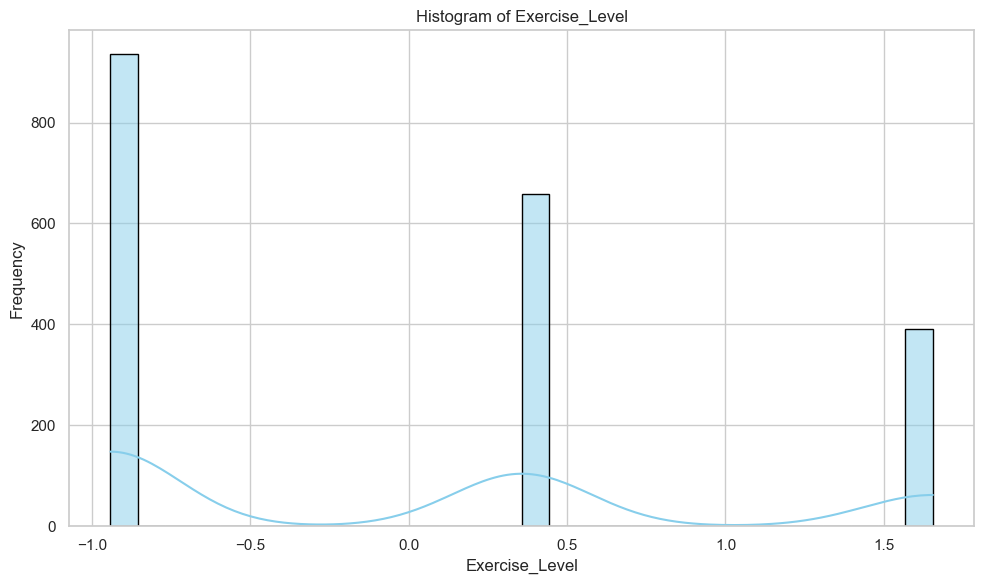

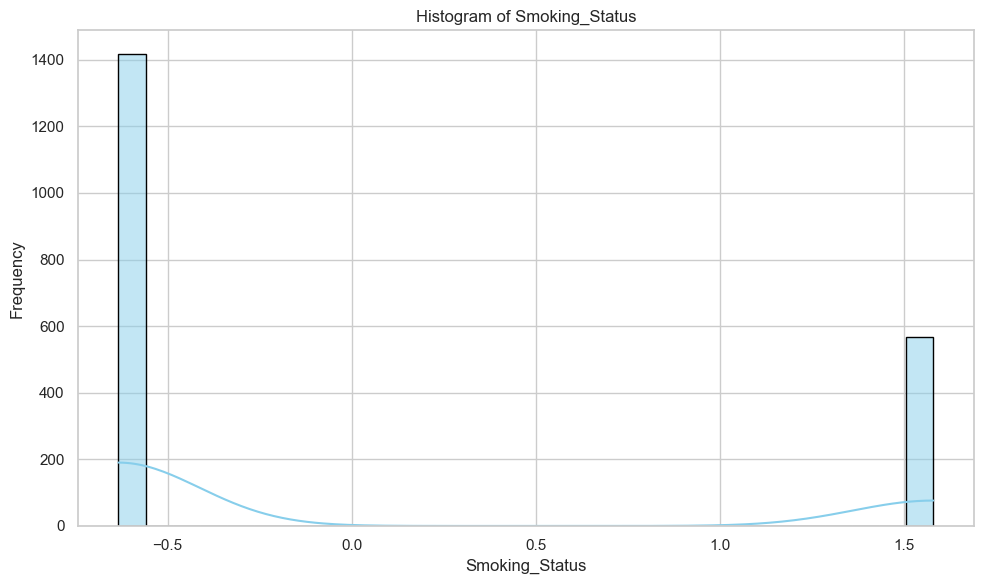

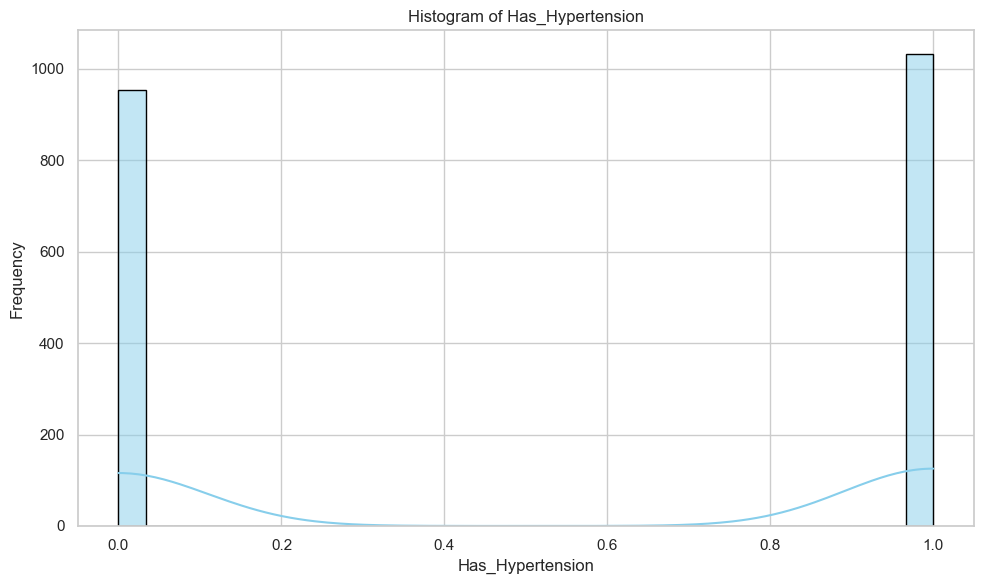

In [155]:
# Plot histogram for each numeric column
for col in numeric_cols:
    plt.figure()
    sns.histplot(df[col].dropna(), bins=30, kde=True, color='skyblue', edgecolor='black')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

In [156]:
# Set plot style
sns.set(style='whitegrid')
plt.rcParams["figure.figsize"] = (10, 6)

In [157]:
# Identify numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

In [158]:
# Identify possible ordered or time-based columns
ordered_cols = ['Age', 'Date', 'Week', 'Day']  # Add if known
ordered_col = None
for col in ordered_cols:
    if col in df.columns:
        ordered_col = col
        break

In [159]:
# If no time/ordered column, use index
if not ordered_col:
    df.reset_index(inplace=True)
    ordered_col = 'index'

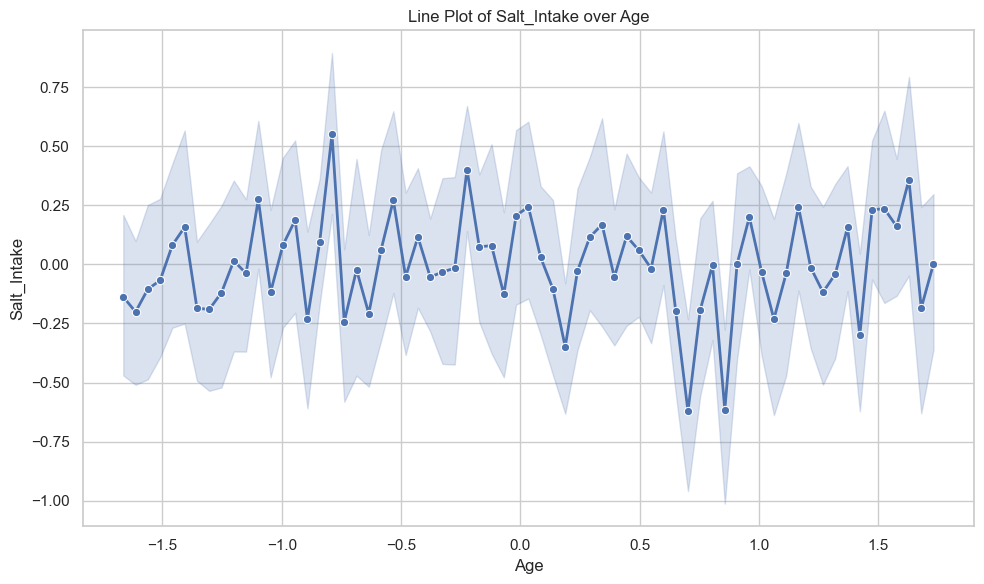

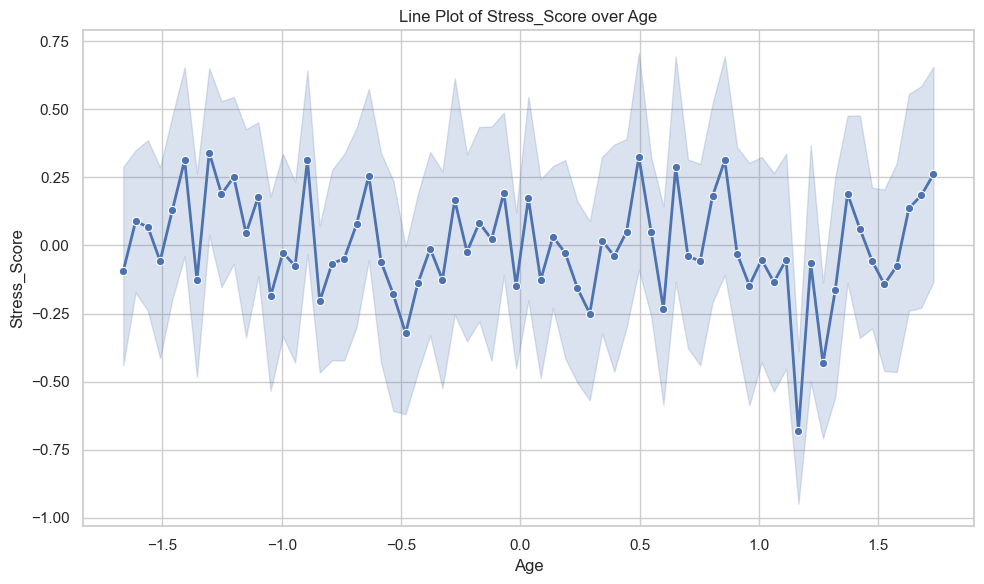

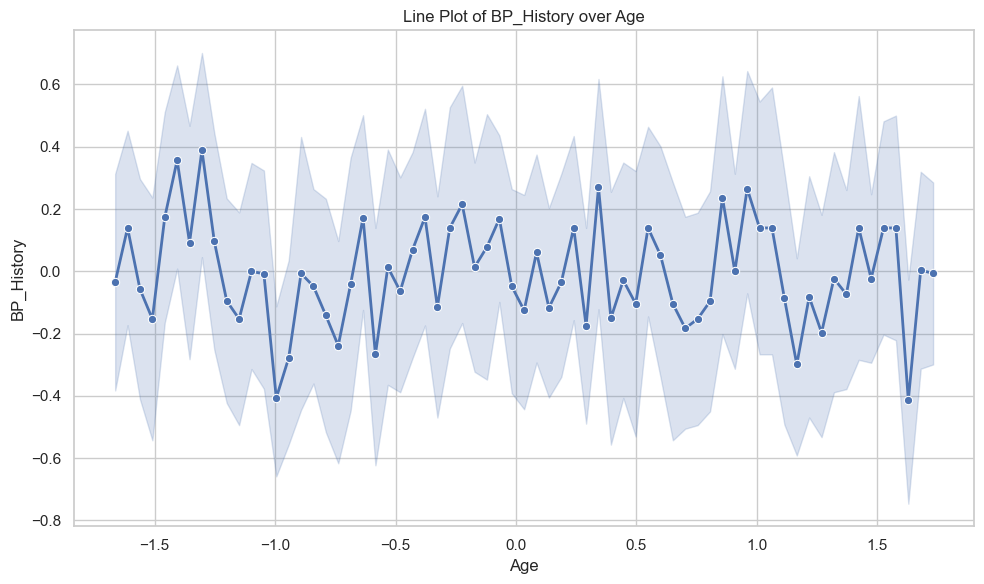

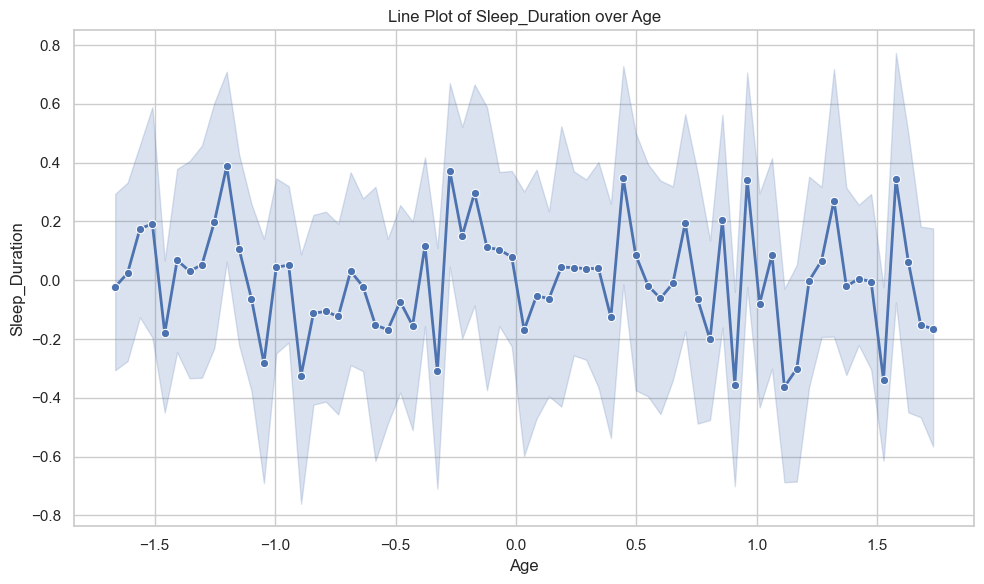

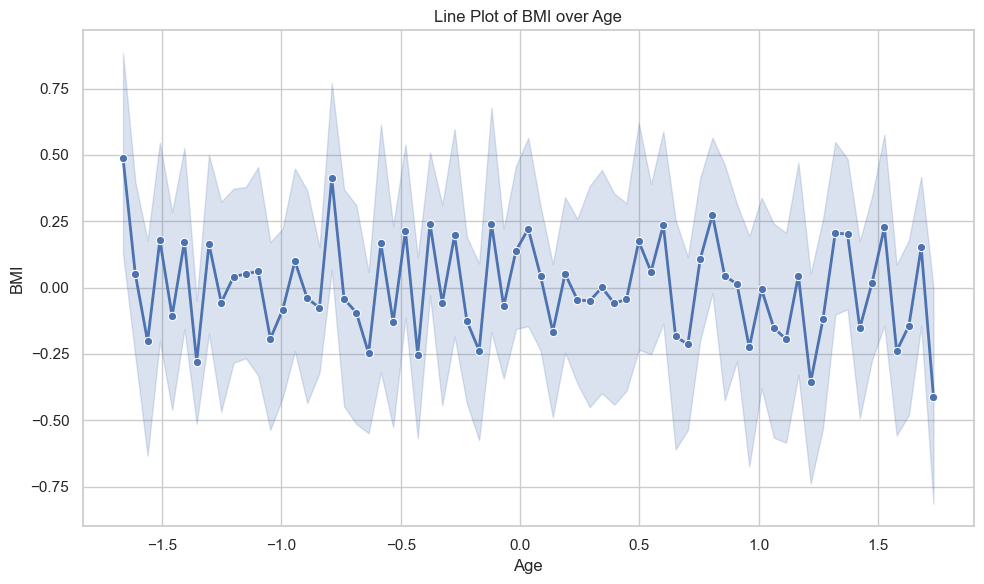

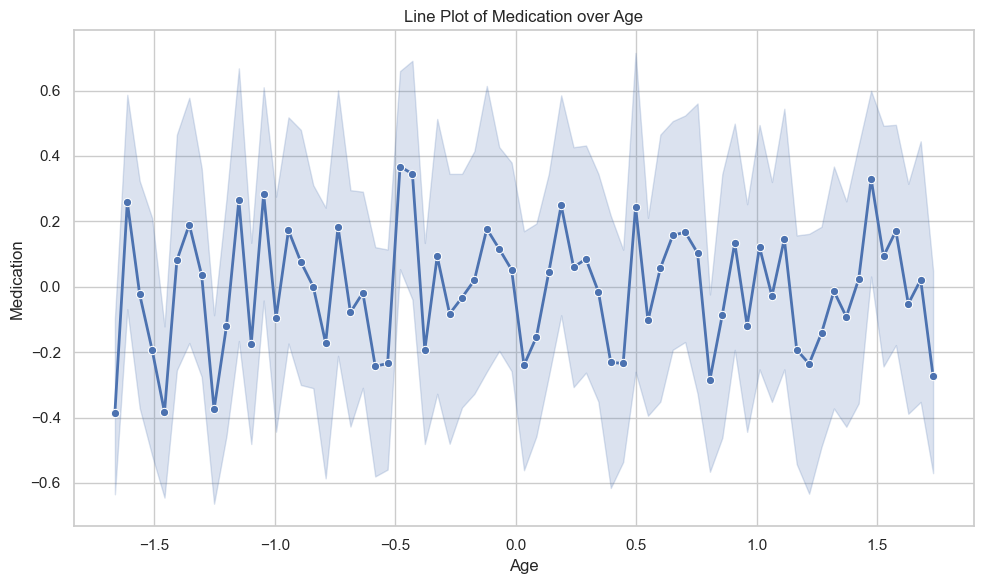

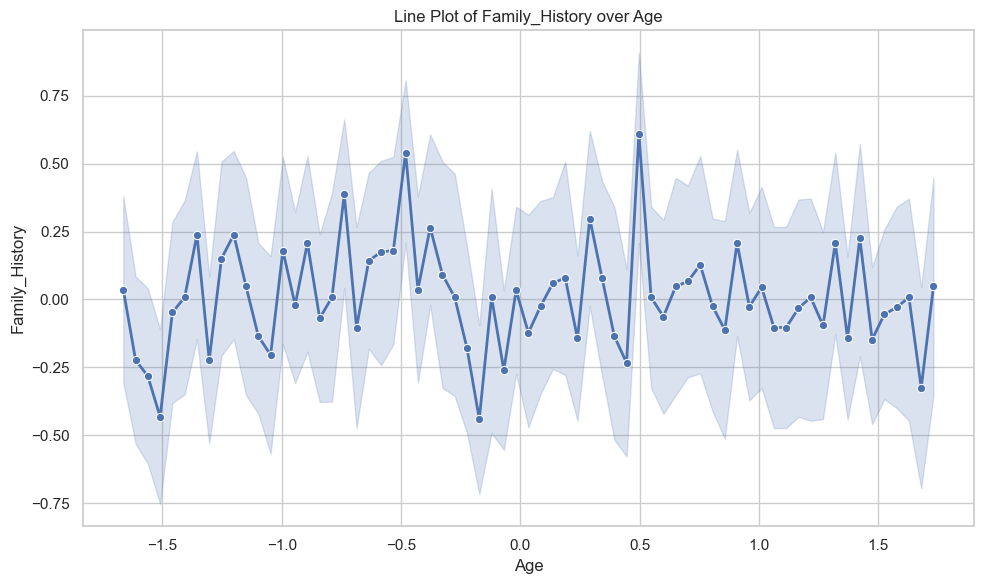

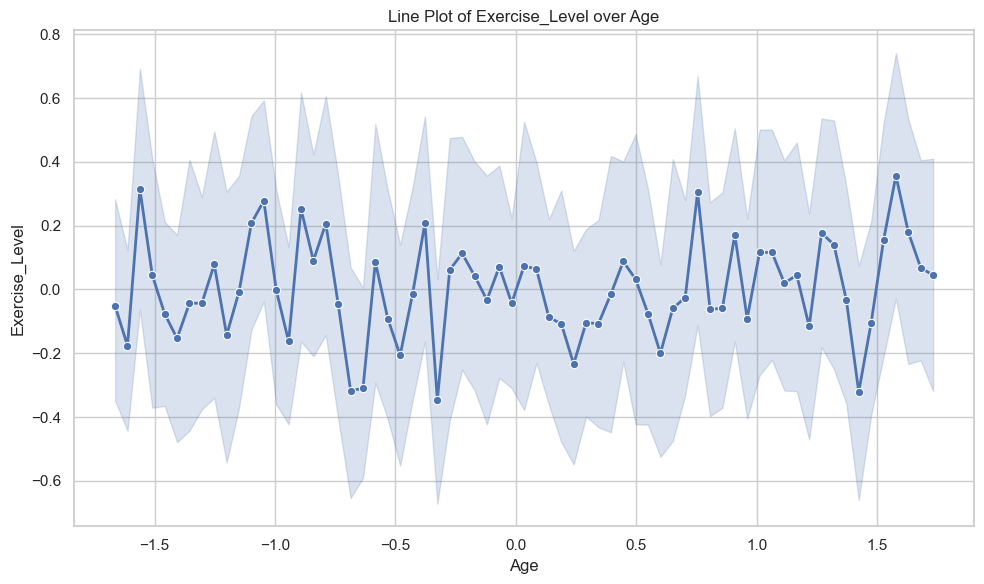

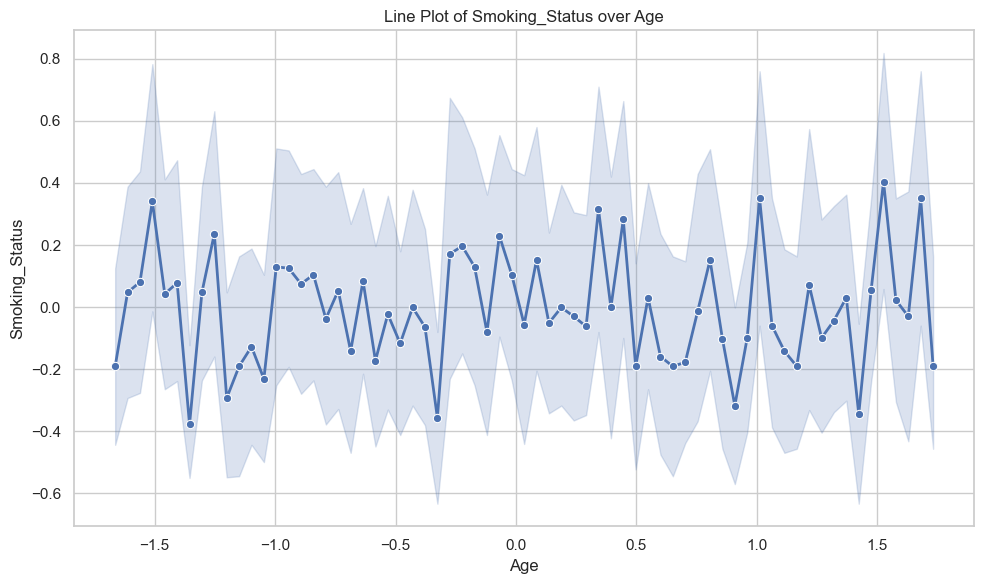

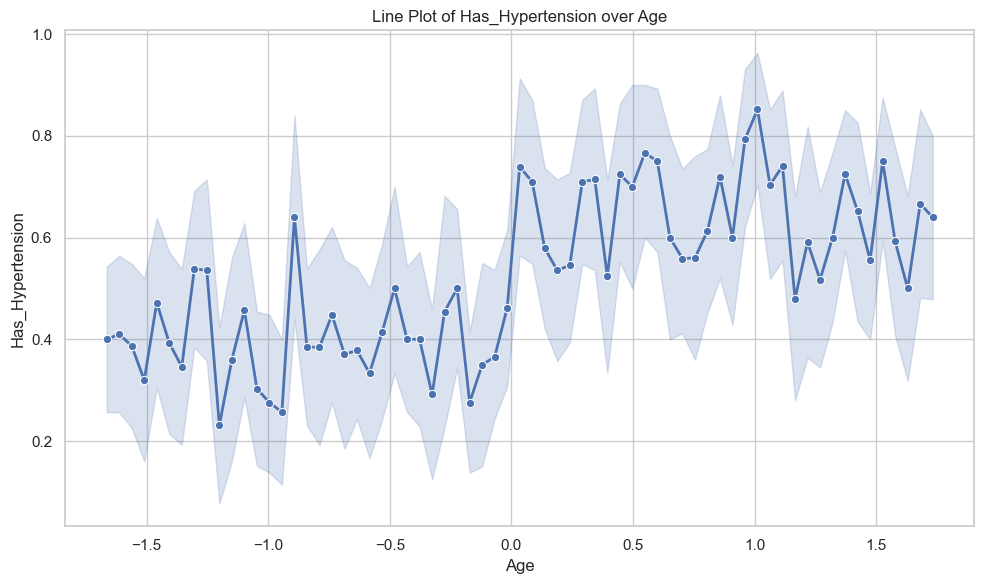

In [160]:
# Plot lineplot for each numeric column against ordered_col
for col in numeric_cols:
    if col == ordered_col:
        continue
    plt.figure()
    sns.lineplot(data=df, x=ordered_col, y=col, marker='o', linewidth=2)
    plt.title(f'Line Plot of {col} over {ordered_col}')
    plt.xlabel(ordered_col)
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

In [161]:
categorical_cols = []
for col in df.columns:
    if df[col].dtype == 'object':
        categorical_cols.append(col)
    elif df[col].nunique() <= 10 and df[col].dtype in ['int64', 'float64']:
        categorical_cols.append(col)

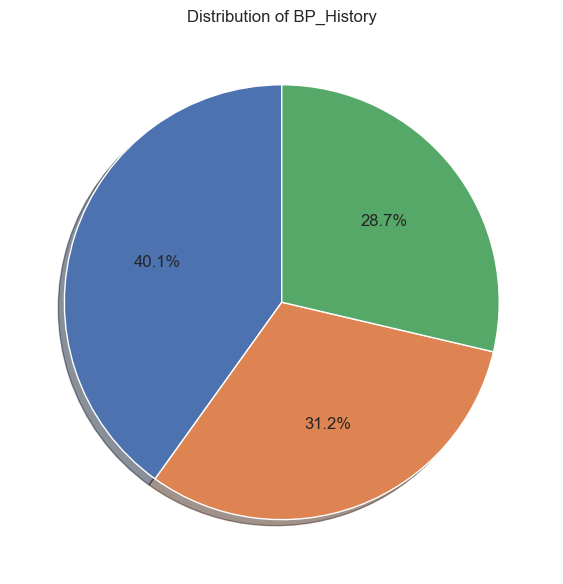

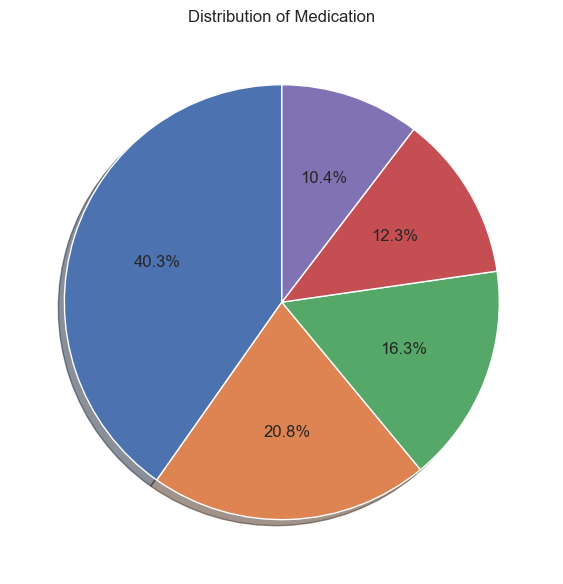

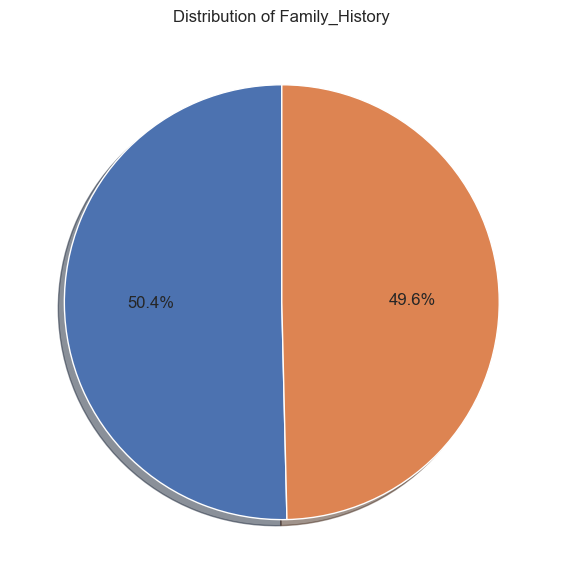

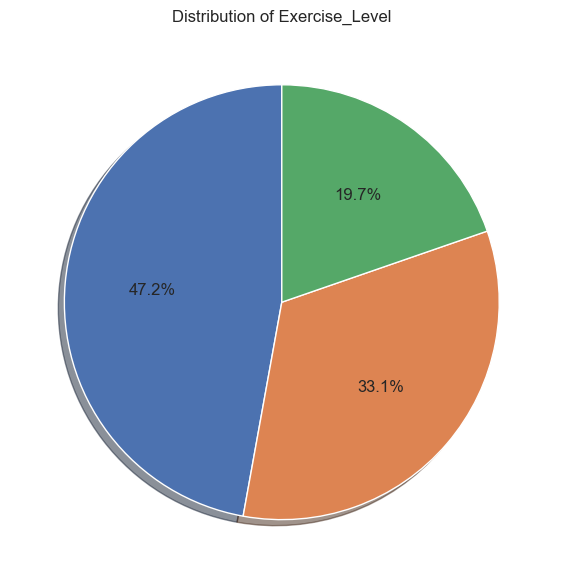

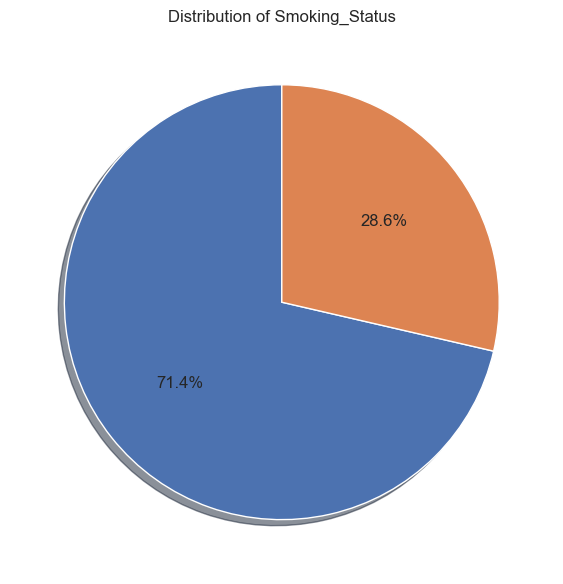

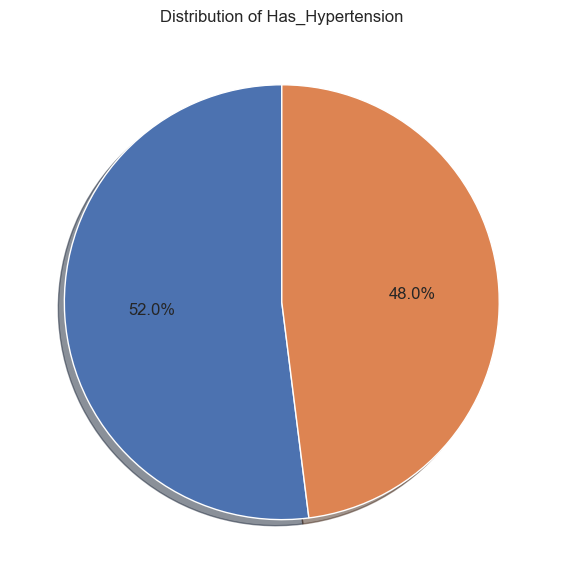

In [162]:
# Plot pie charts
for col in categorical_cols:
    counts = df[col].value_counts()
    plt.figure(figsize=(6, 6))
    plt.pie(counts, autopct='%1.1f%%', startangle=90, shadow=True)  # 去掉 labels
    plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()

In [163]:
# Check your data first
print(f"DataFrame shape: {df.shape}")
df = df.dropna()
print(f"After dropna: {df.shape}")

DataFrame shape: (1985, 11)
After dropna: (1985, 11)


In [164]:
# Select numeric columns
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
print(f"Numeric columns: {list(numeric_cols)}")

Numeric columns: ['Age', 'Salt_Intake', 'Stress_Score', 'BP_History', 'Sleep_Duration', 'BMI', 'Medication', 'Family_History', 'Exercise_Level', 'Smoking_Status', 'Has_Hypertension']


In [165]:
# Check if hue column exists
hue_col = 'Has_Hypertension' if 'Has_Hypertension' in df.columns else None

In [166]:
# Identify categorical columns with ≤10 unique values for grouping
categorical_cols = [col for col in df.select_dtypes(include='object').columns if df[col].nunique() <= 10]

Valid columns: ['Age', 'Salt_Intake', 'Stress_Score', 'BP_History', 'Sleep_Duration', 'BMI', 'Medication', 'Family_History', 'Exercise_Level', 'Smoking_Status', 'Has_Hypertension']


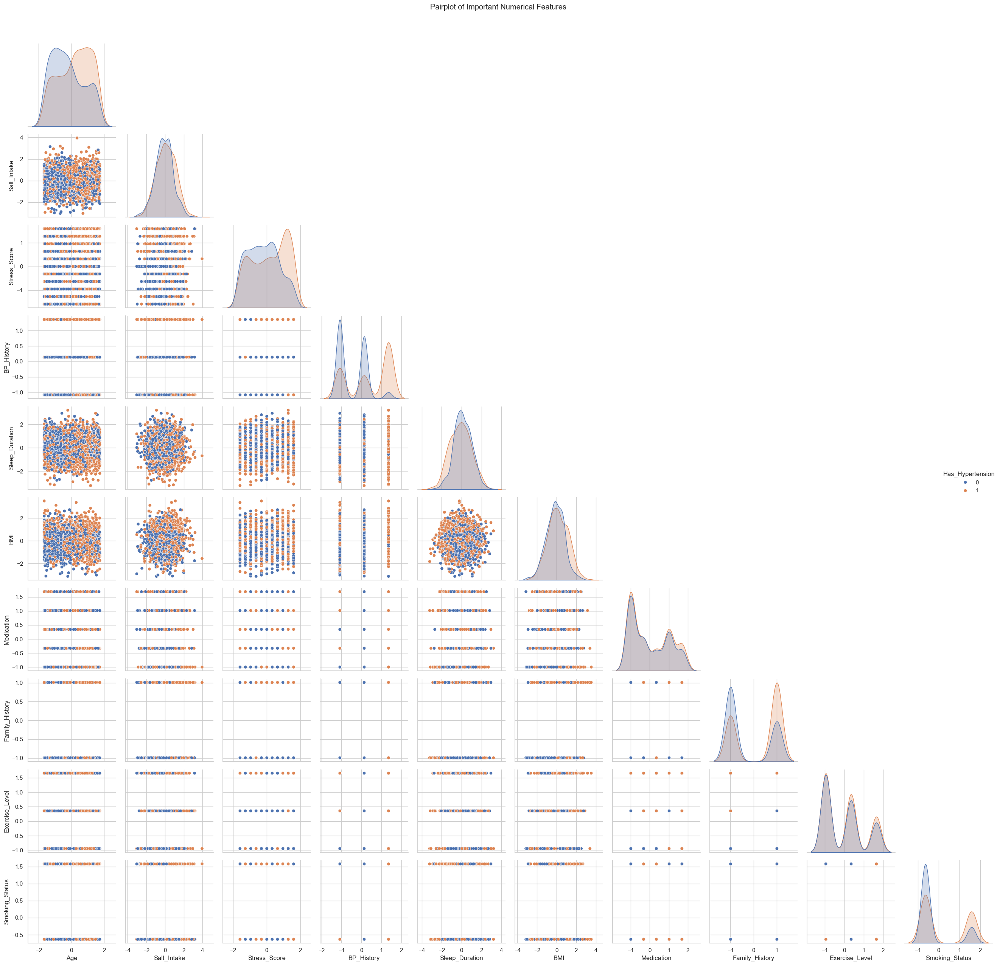

In [167]:
import numpy as np

# More robust filtering
valid_numeric_cols = []
for col in df.columns:
    try:
        # Check if column contains only scalar numeric values
        if df[col].dtype in ['int64', 'float64']:
            # Additional check: ensure first value is not an array
            if not isinstance(df[col].iloc[0], (list, np.ndarray)):
                valid_numeric_cols.append(col)
    except:
        pass

print(f"Valid columns: {valid_numeric_cols}")

# Create pairplot
hue_col = 'Has_Hypertension' if 'Has_Hypertension' in df.columns else None
if hue_col and hue_col not in valid_numeric_cols:
    cols_to_plot = valid_numeric_cols + [hue_col]
else:
    cols_to_plot = valid_numeric_cols

sns.pairplot(df[cols_to_plot], hue=hue_col, corner=True, diag_kind='kde')
plt.suptitle("Pairplot of Important Numerical Features", y=1.02)
plt.tight_layout()
plt.show()

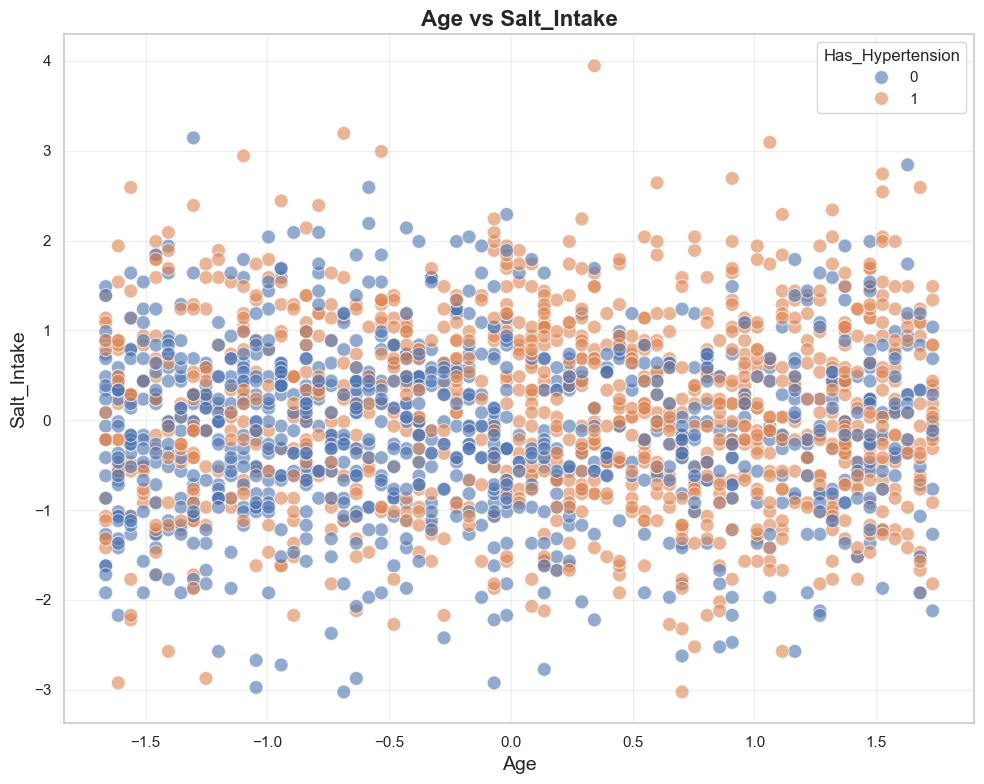

Showing plot 1/45: Age vs Salt_Intake



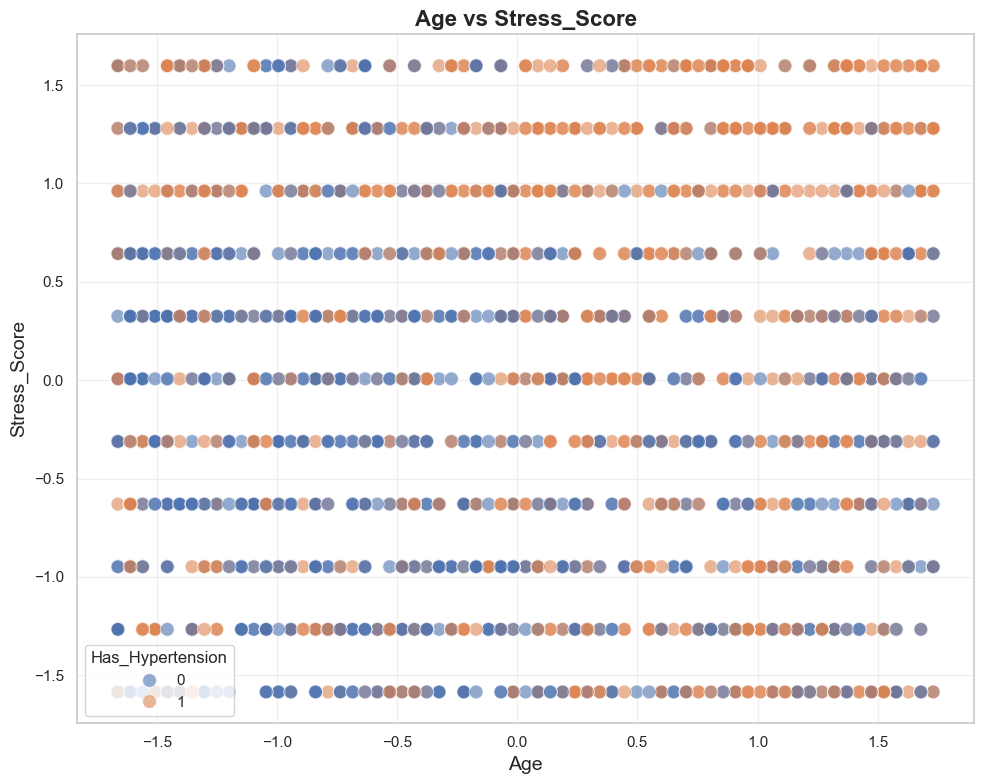

Showing plot 2/45: Age vs Stress_Score



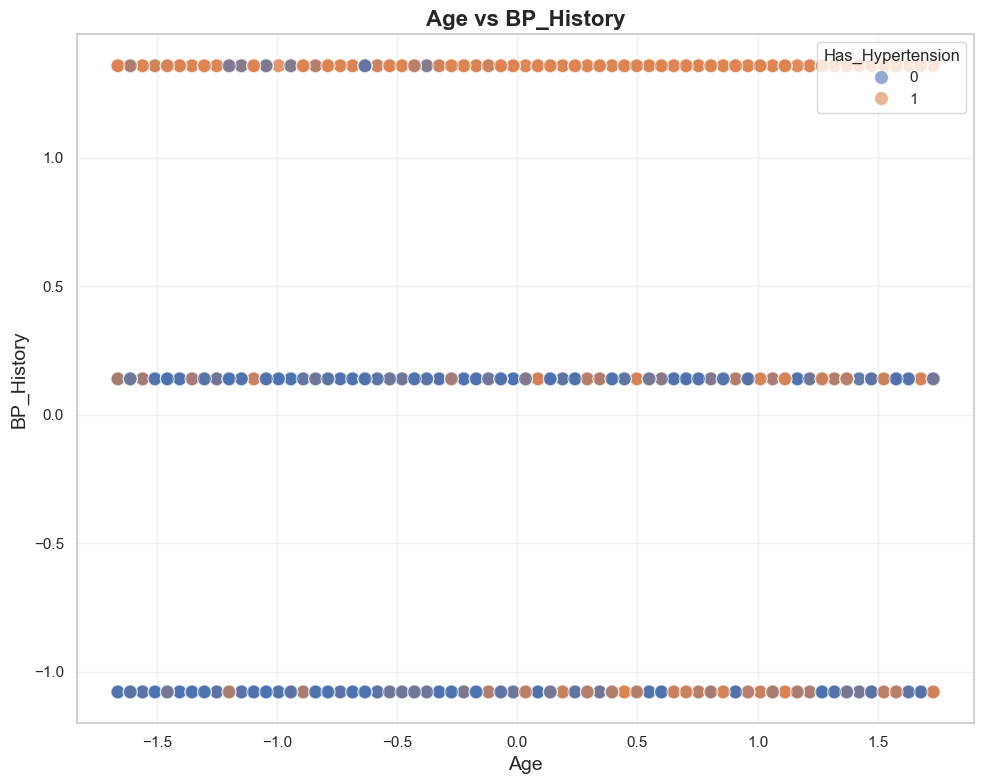

Showing plot 3/45: Age vs BP_History



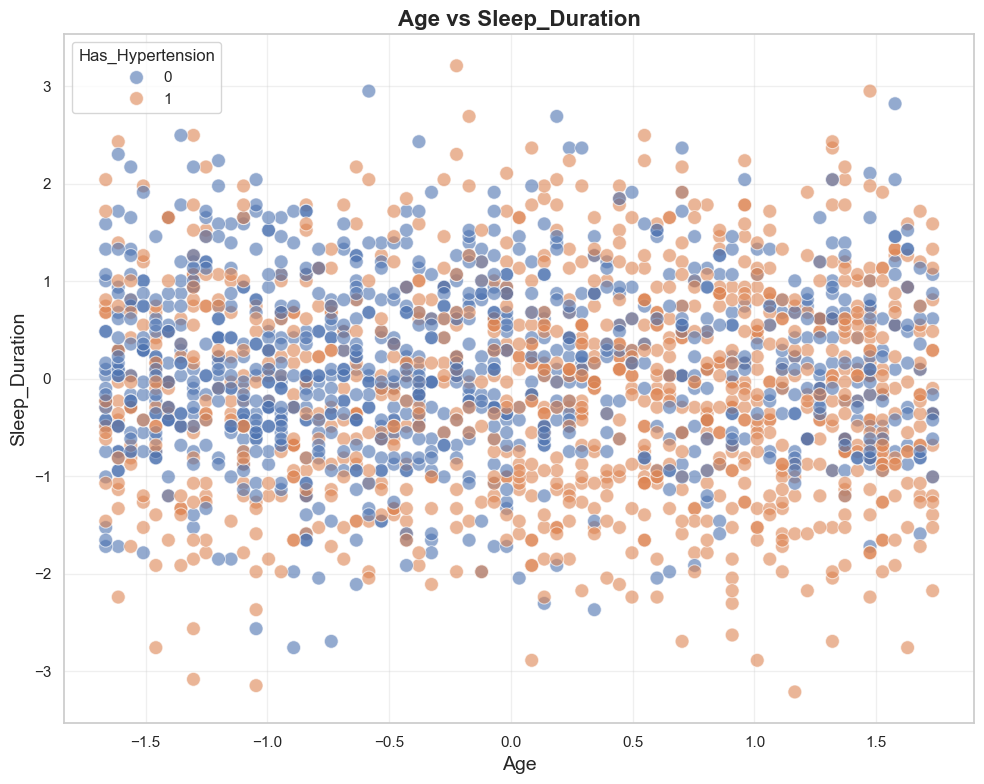

Showing plot 4/45: Age vs Sleep_Duration



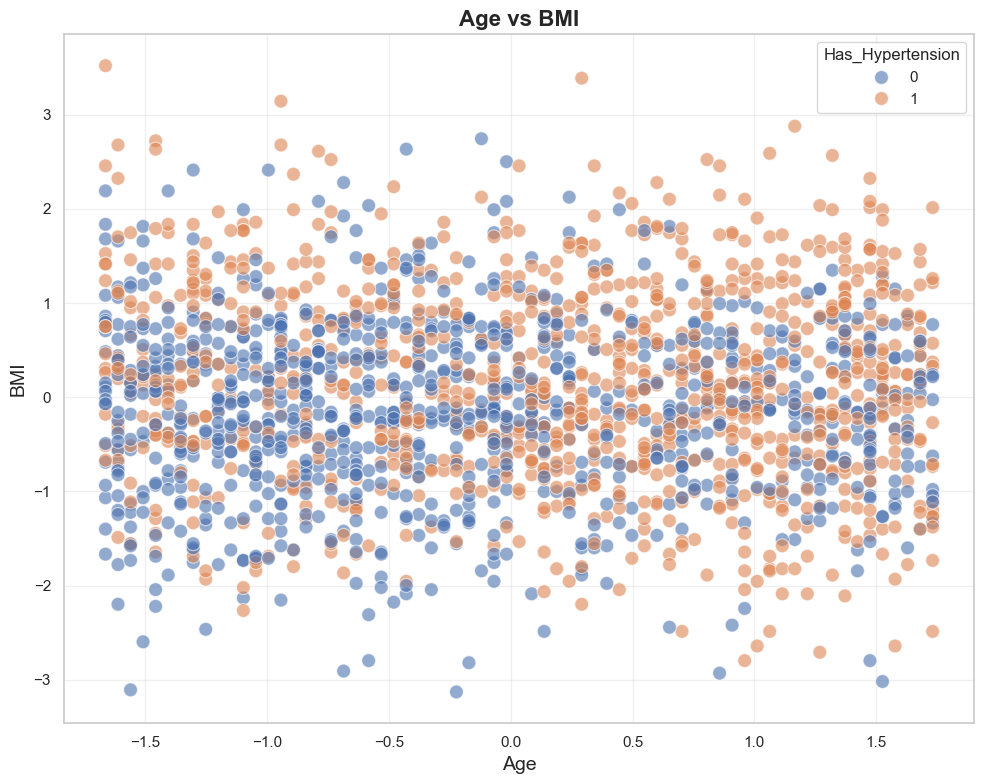

Showing plot 5/45: Age vs BMI



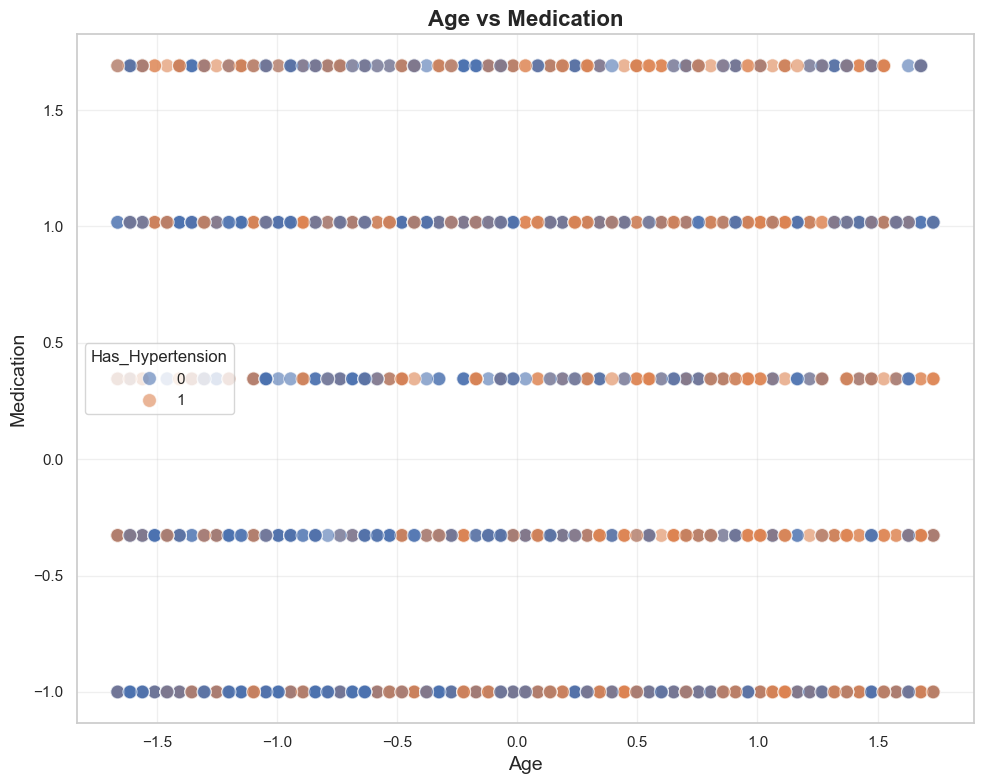

Showing plot 6/45: Age vs Medication



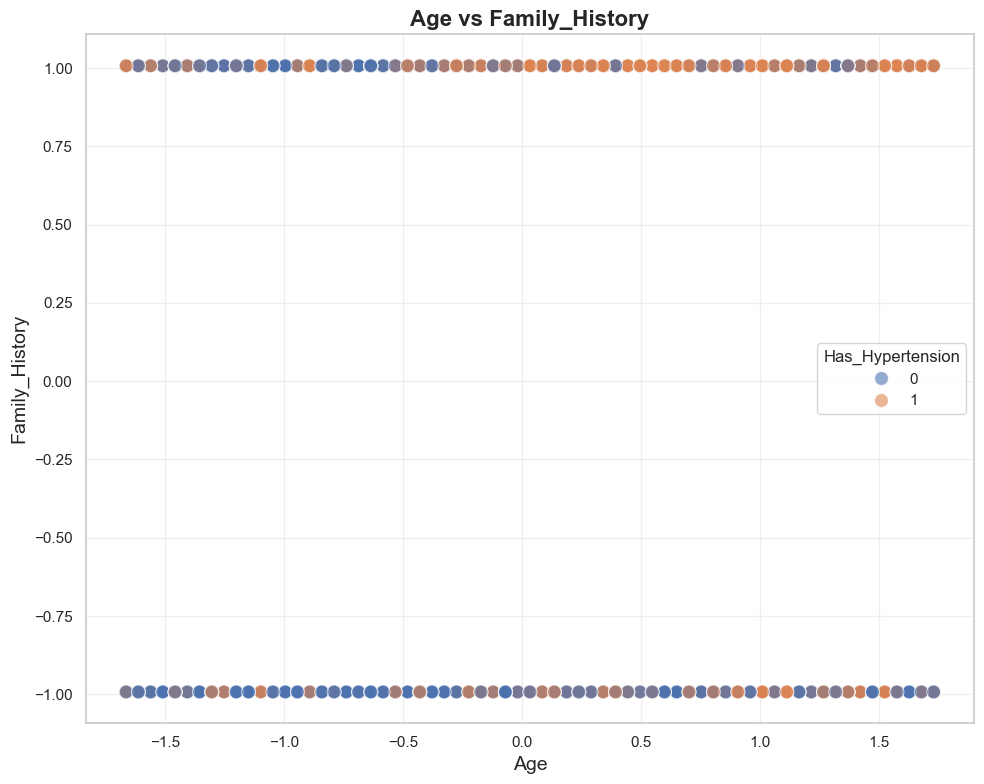

Showing plot 7/45: Age vs Family_History



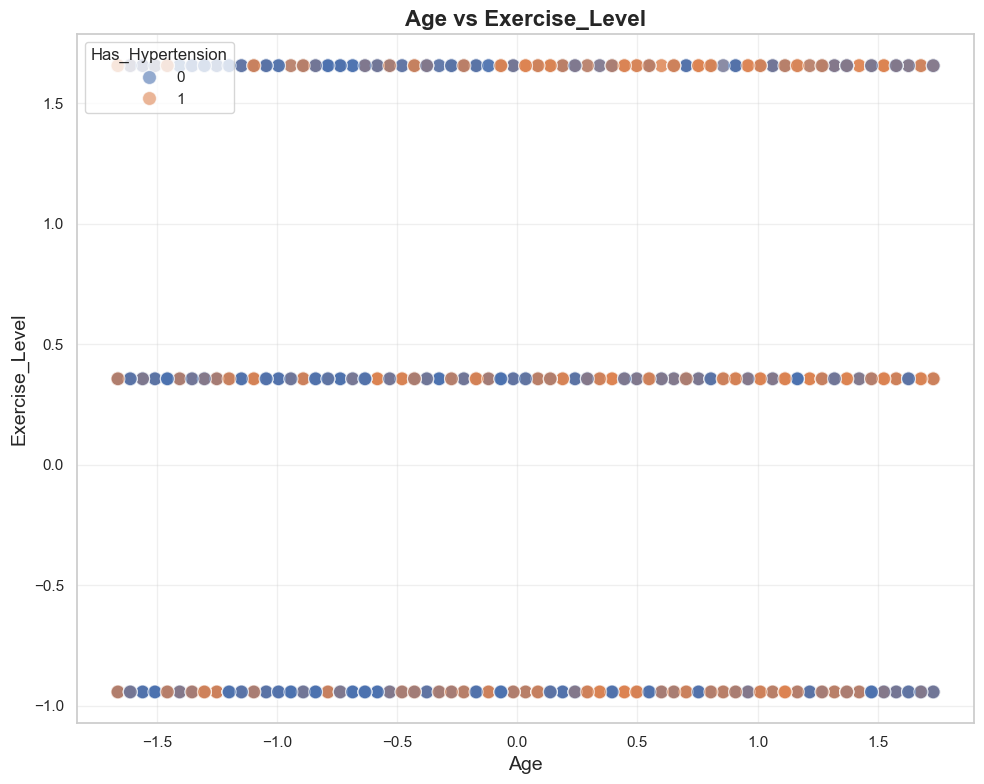

Showing plot 8/45: Age vs Exercise_Level



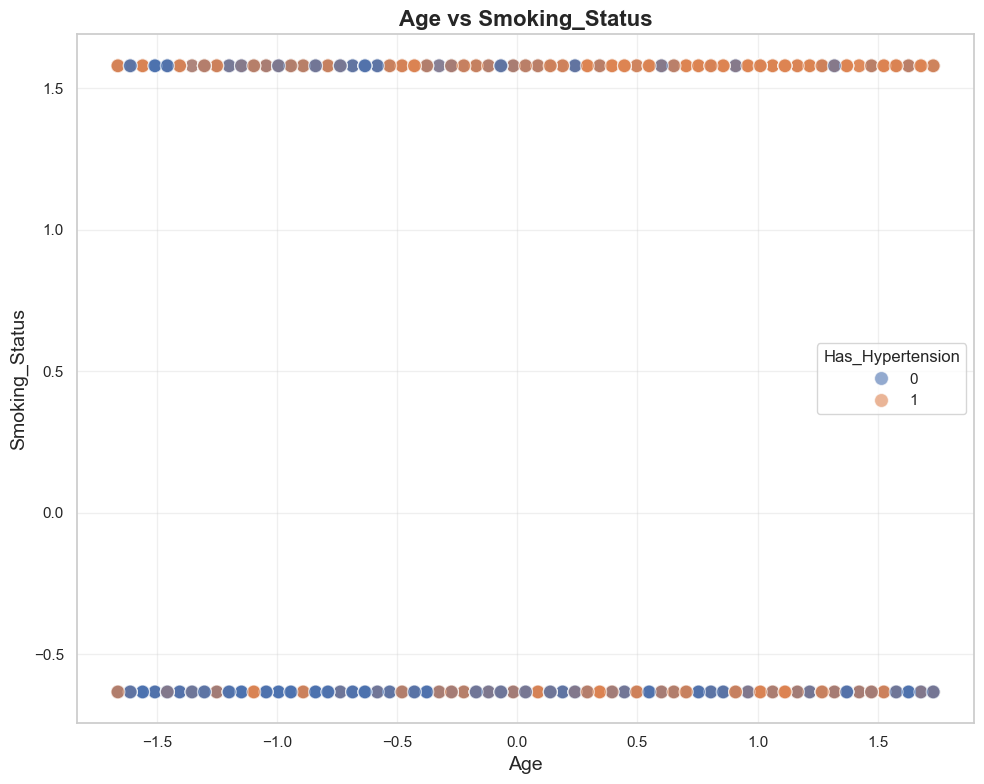

Showing plot 9/45: Age vs Smoking_Status



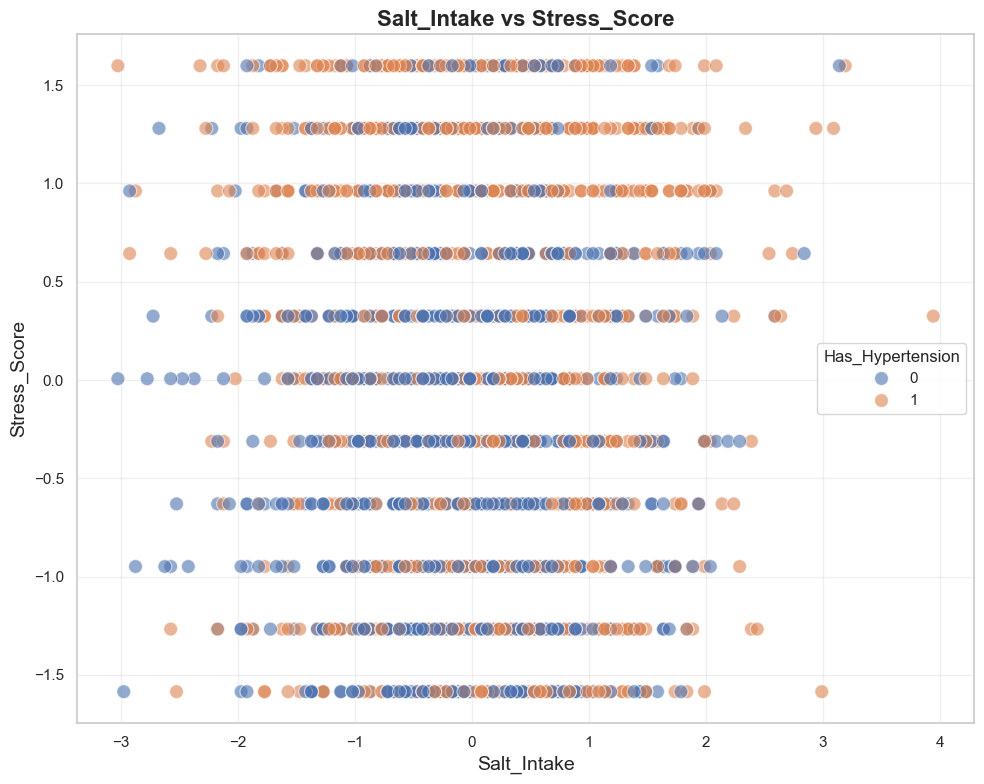

Showing plot 10/45: Salt_Intake vs Stress_Score



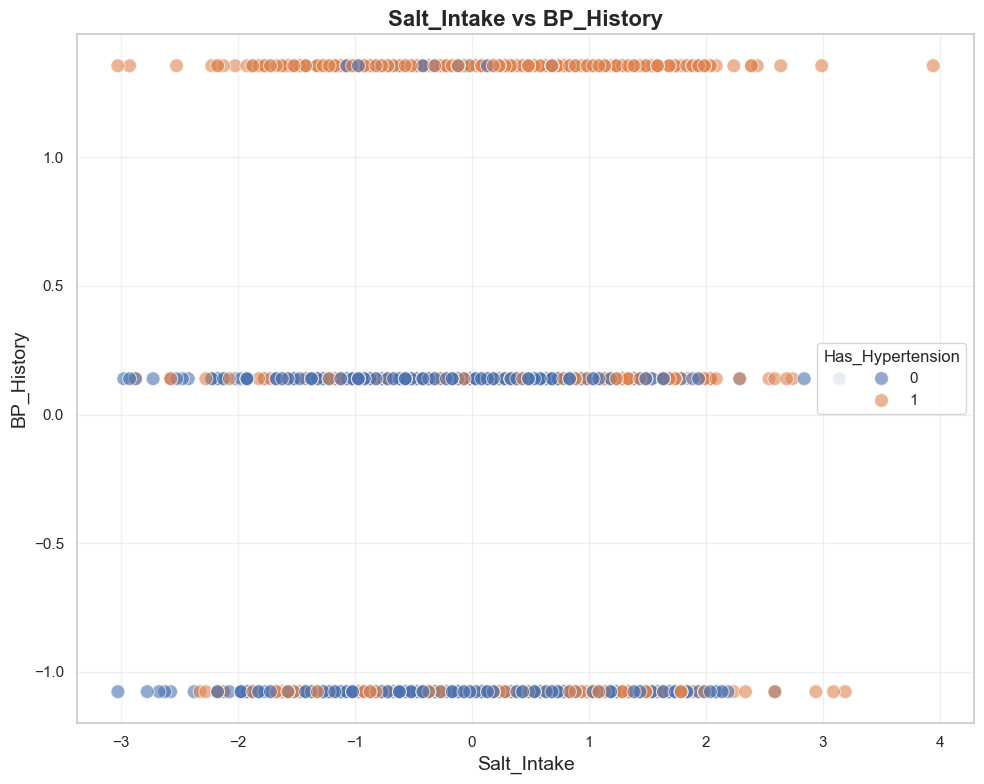

Showing plot 11/45: Salt_Intake vs BP_History



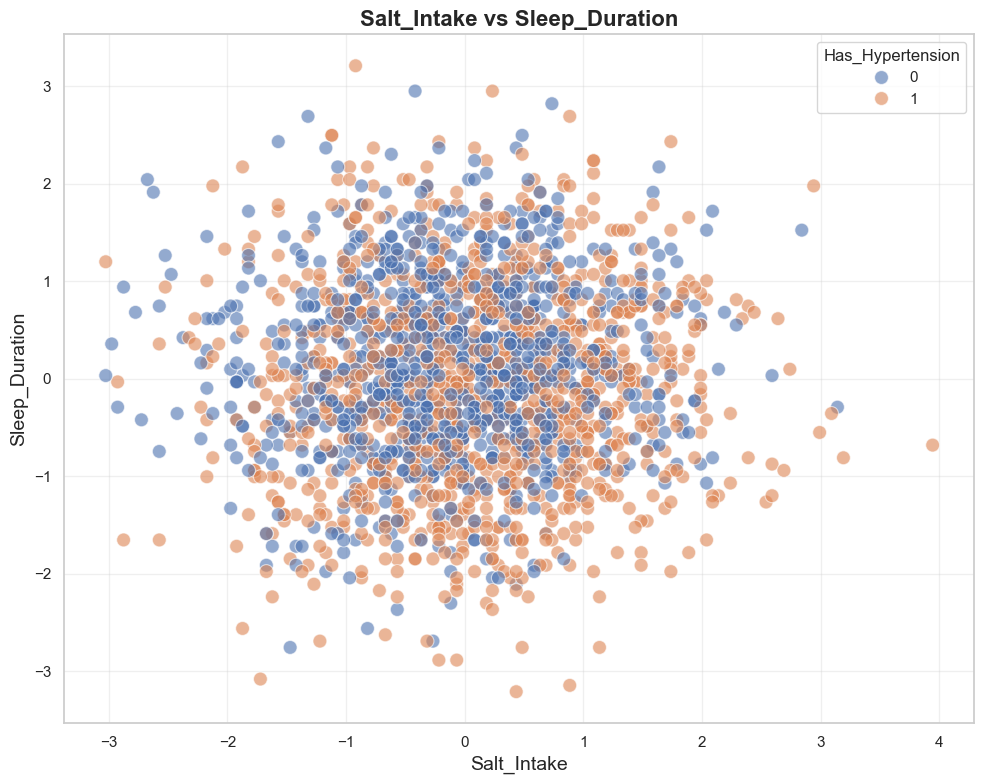

Showing plot 12/45: Salt_Intake vs Sleep_Duration



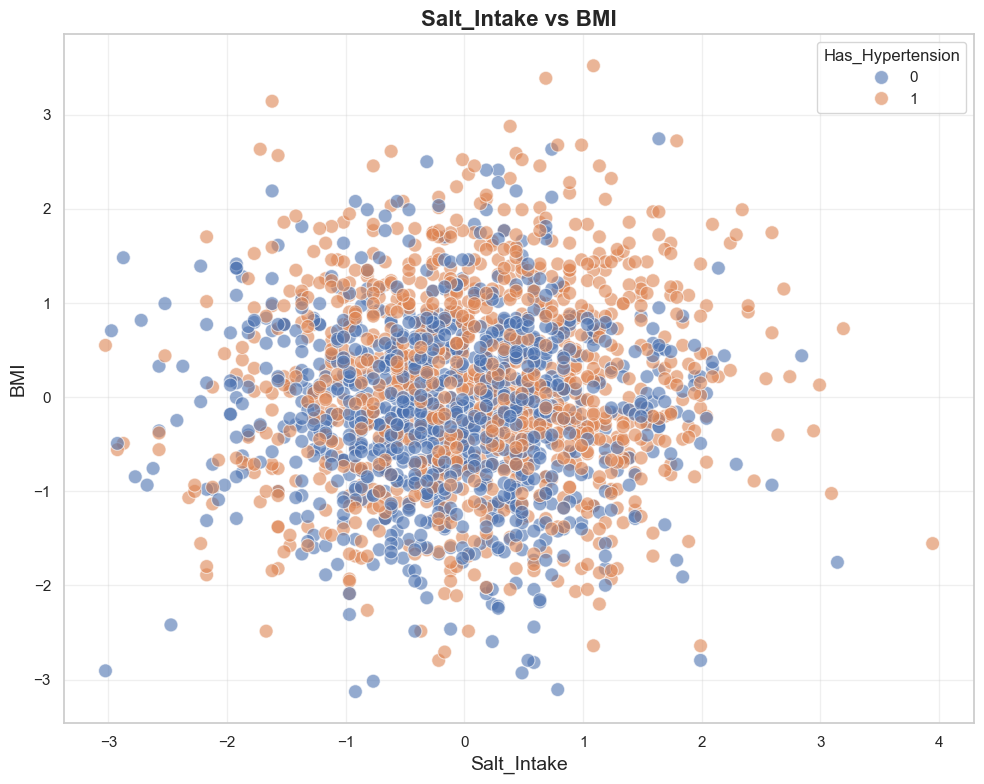

Showing plot 13/45: Salt_Intake vs BMI



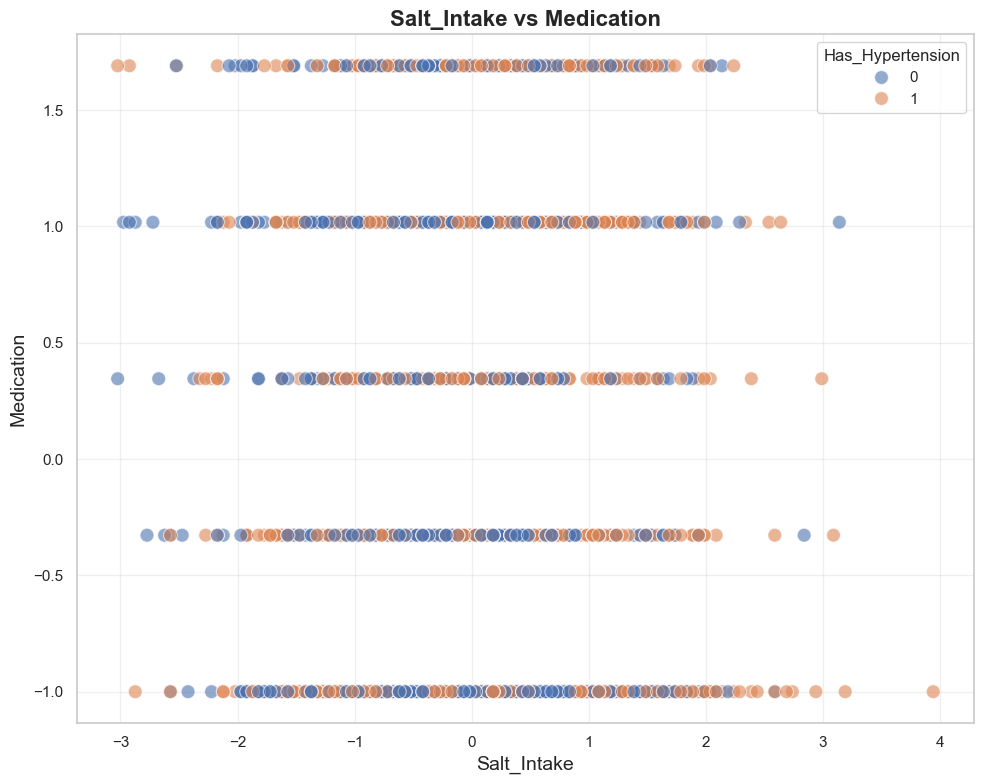

Showing plot 14/45: Salt_Intake vs Medication



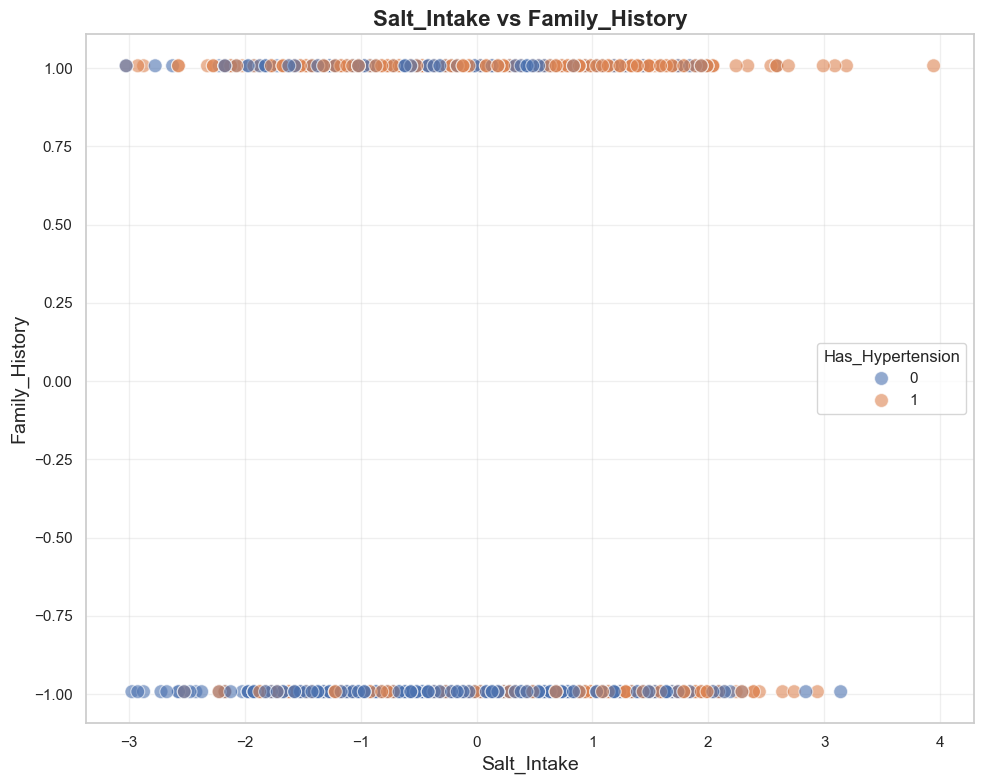

Showing plot 15/45: Salt_Intake vs Family_History



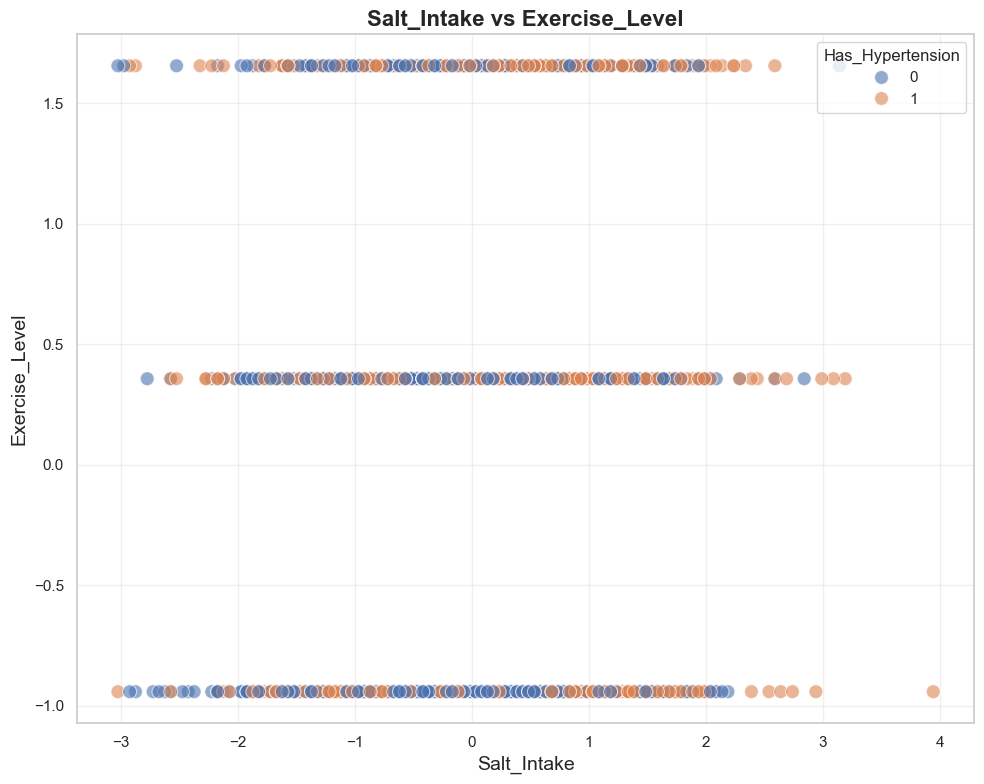

Showing plot 16/45: Salt_Intake vs Exercise_Level



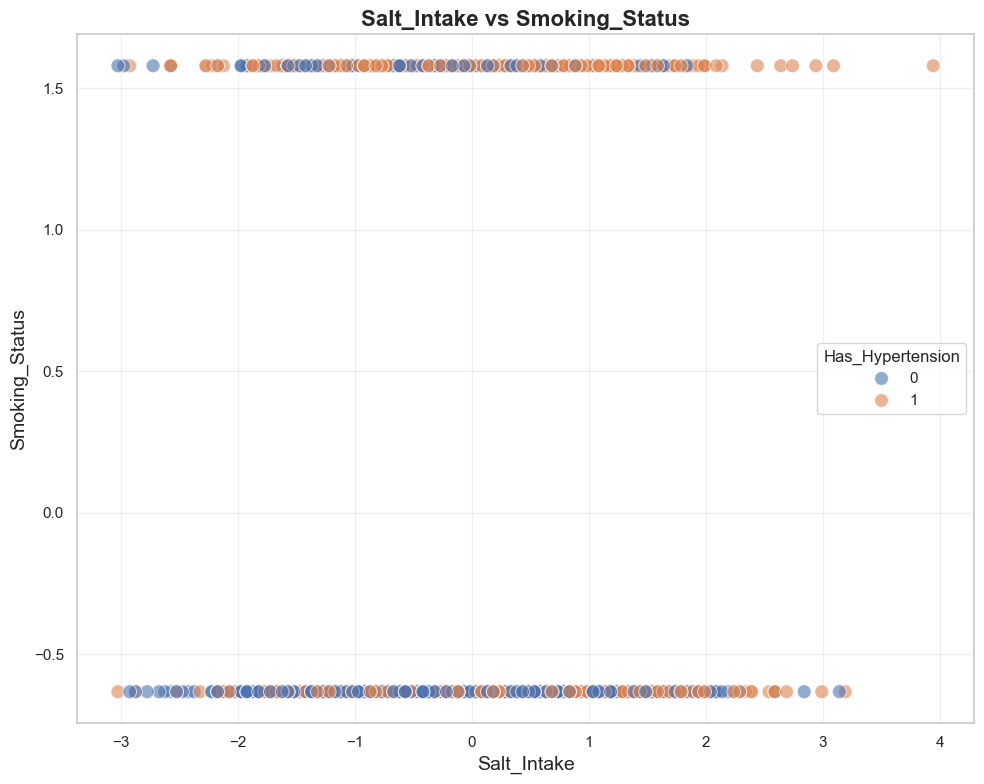

Showing plot 17/45: Salt_Intake vs Smoking_Status



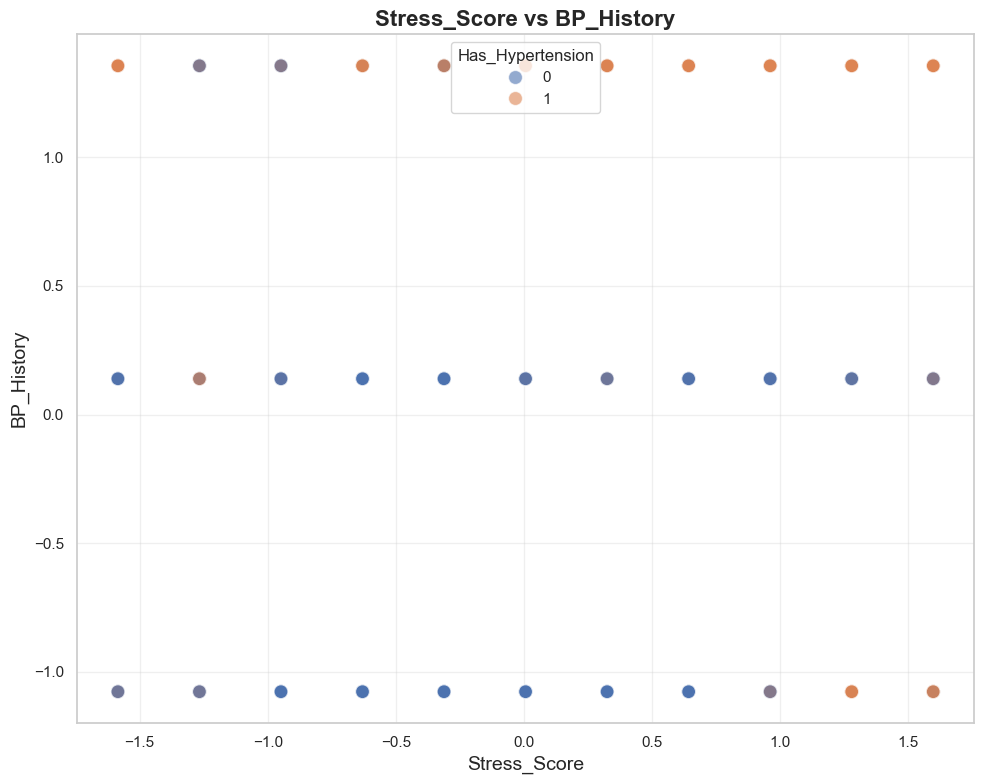

Showing plot 18/45: Stress_Score vs BP_History



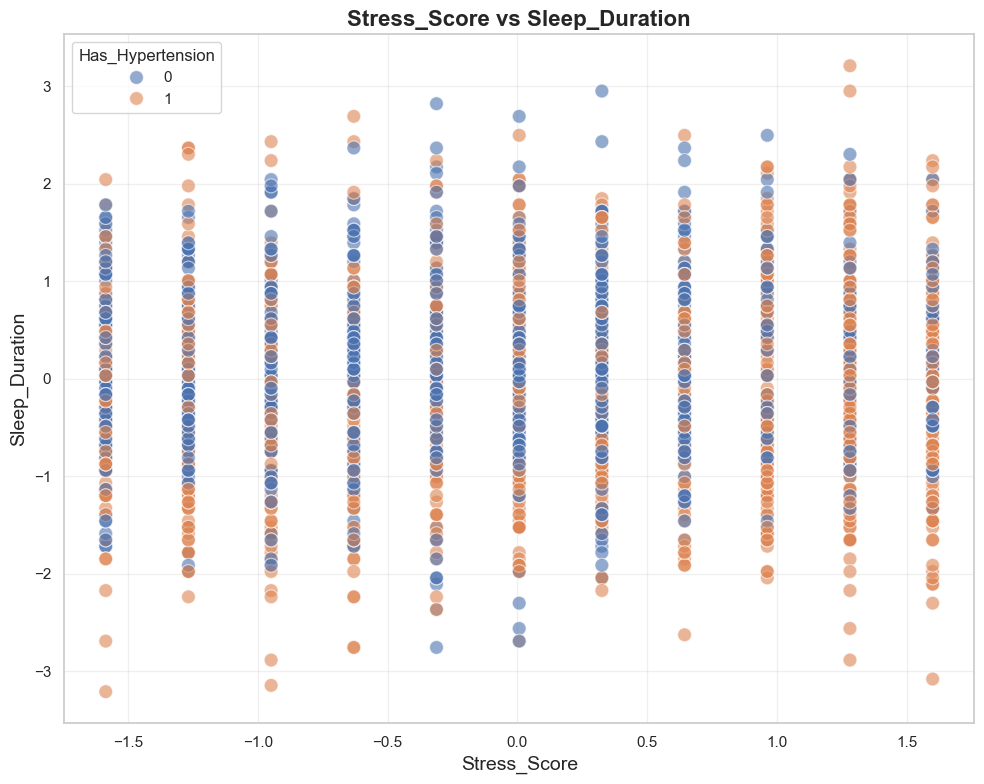

Showing plot 19/45: Stress_Score vs Sleep_Duration



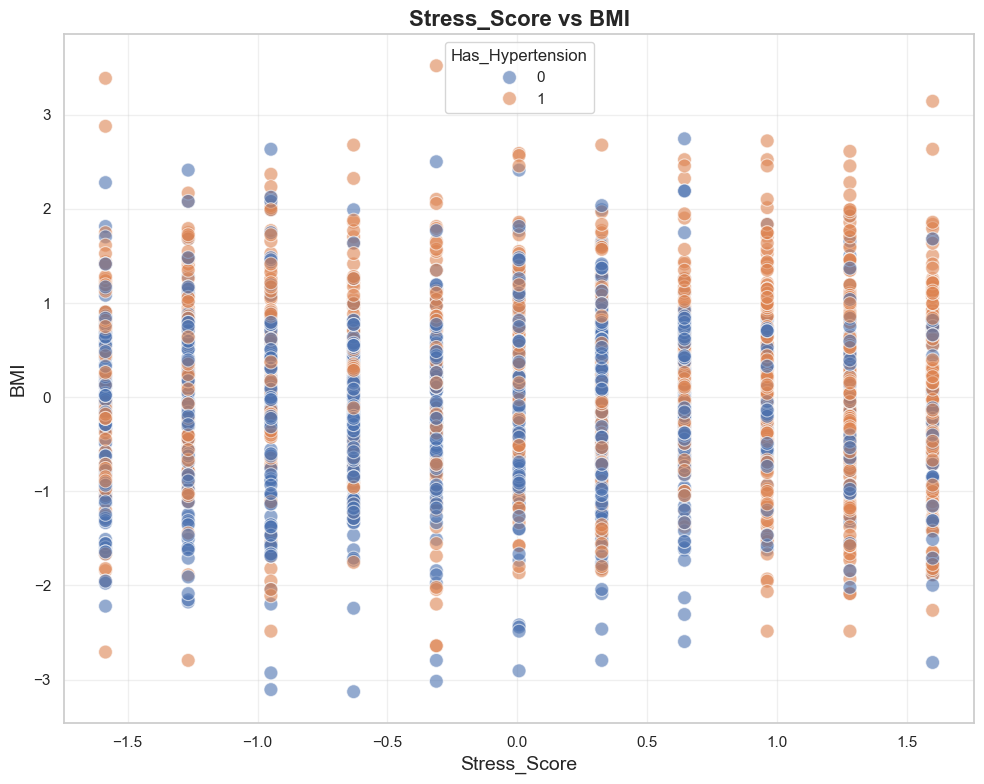

Showing plot 20/45: Stress_Score vs BMI



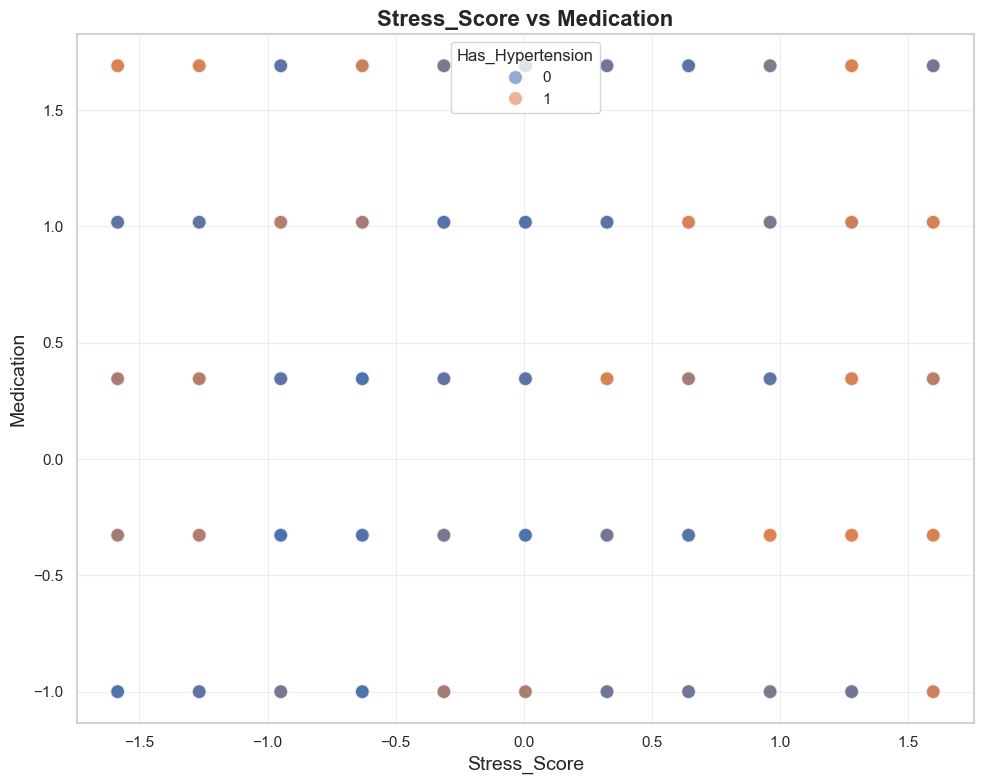

Showing plot 21/45: Stress_Score vs Medication



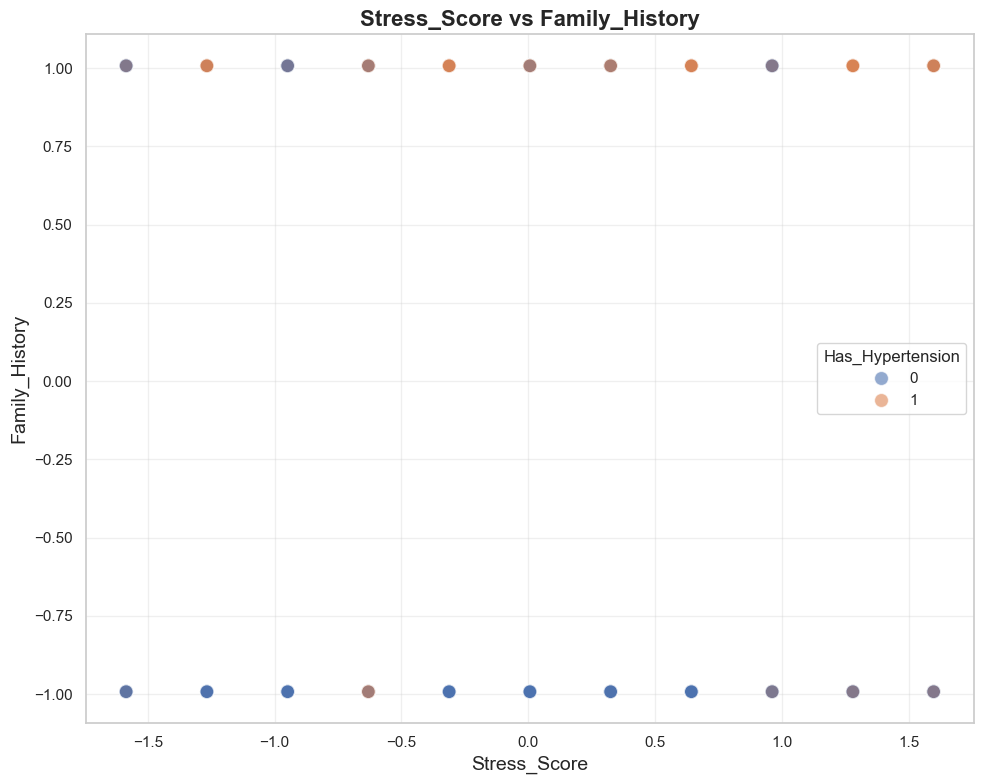

Showing plot 22/45: Stress_Score vs Family_History



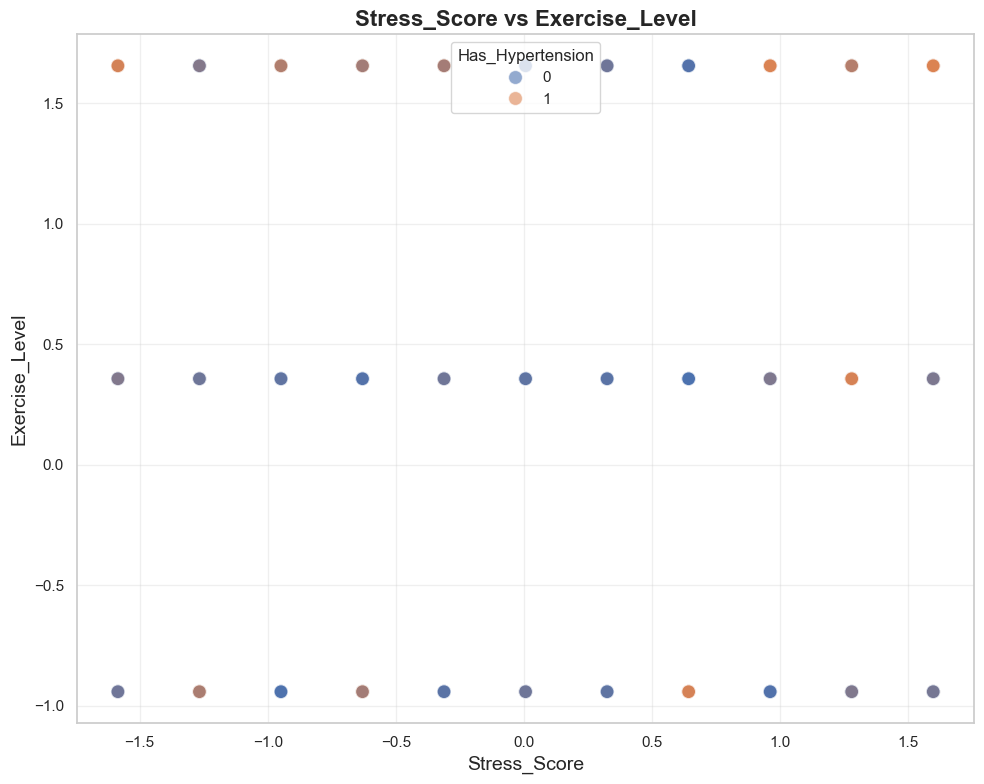

Showing plot 23/45: Stress_Score vs Exercise_Level



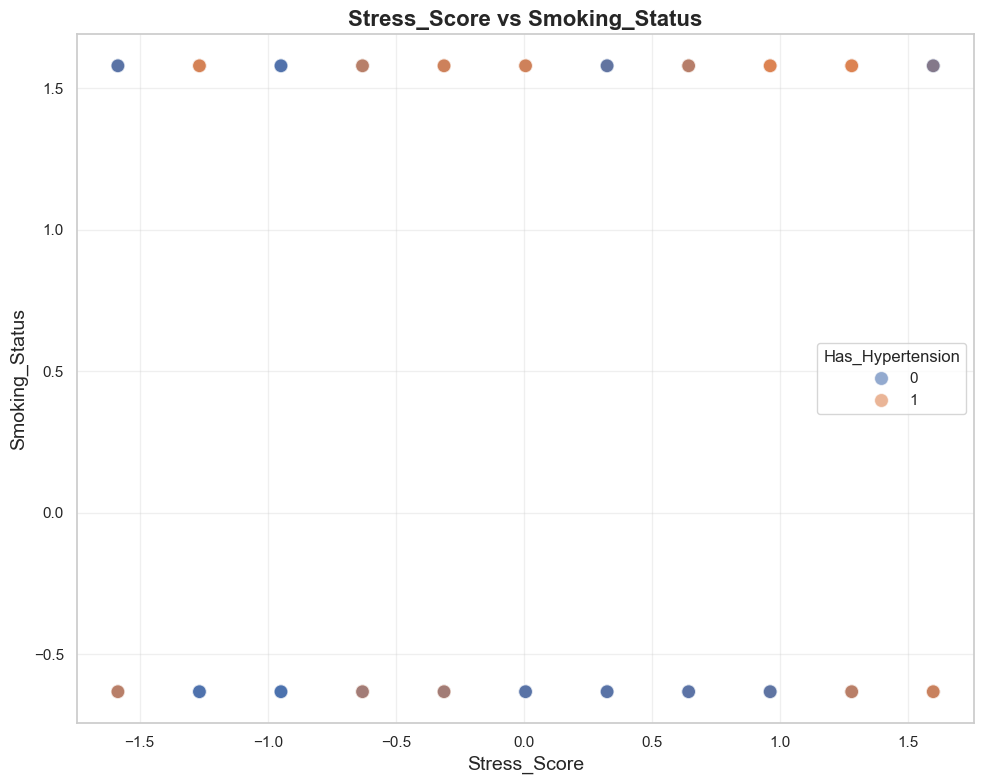

Showing plot 24/45: Stress_Score vs Smoking_Status



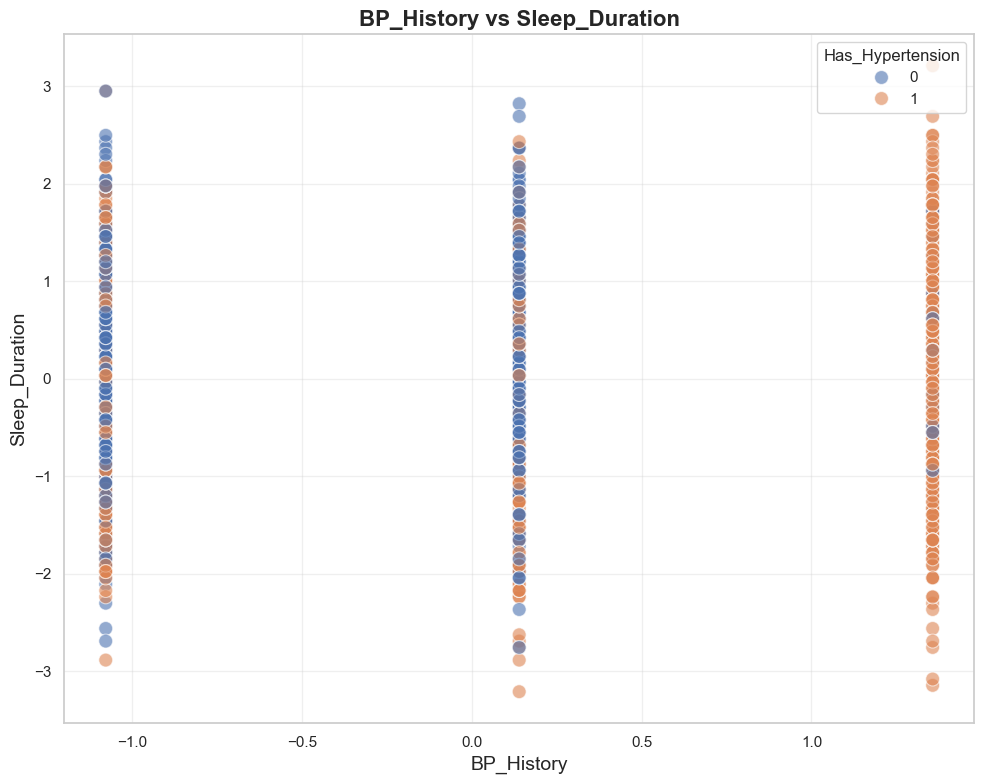

Showing plot 25/45: BP_History vs Sleep_Duration



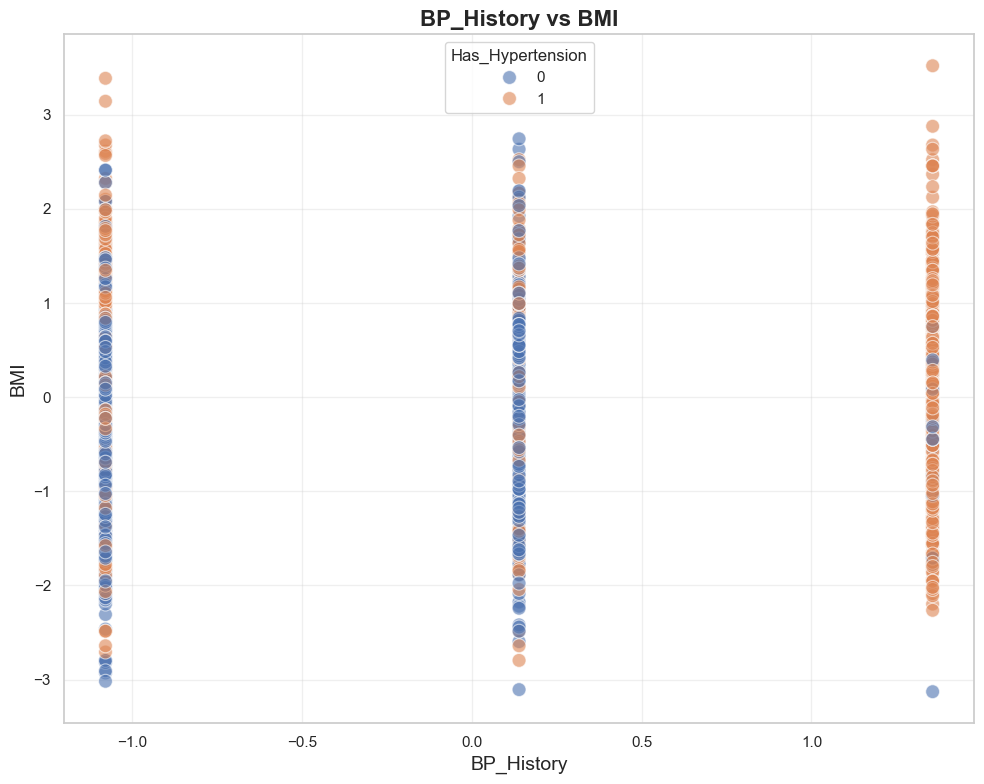

Showing plot 26/45: BP_History vs BMI



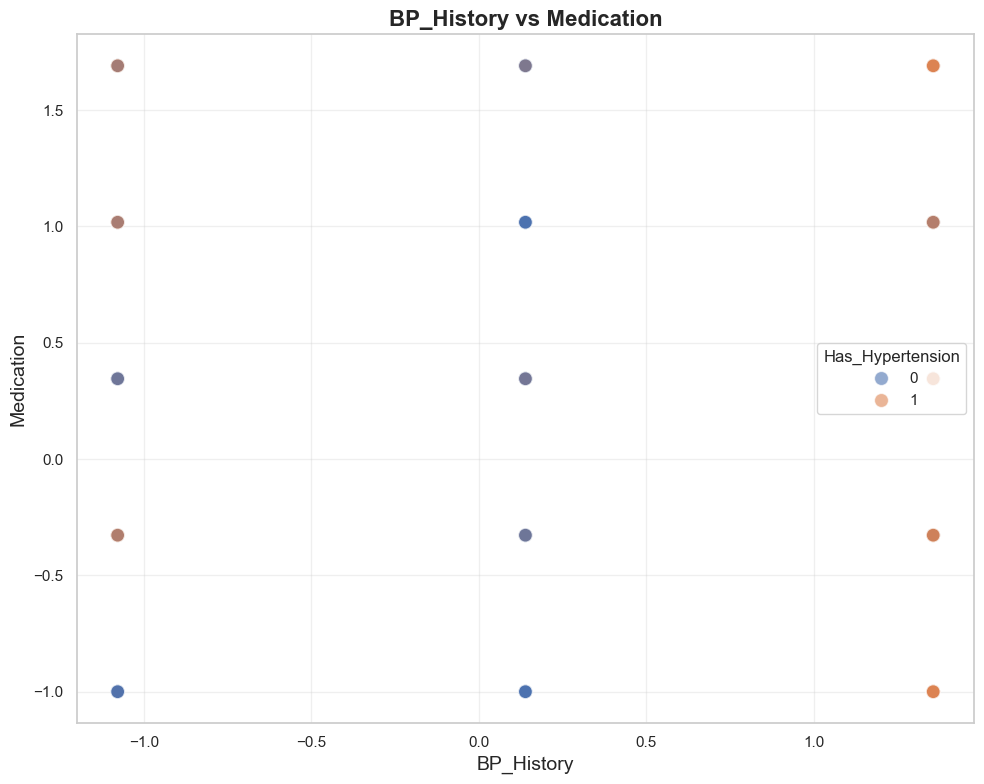

Showing plot 27/45: BP_History vs Medication



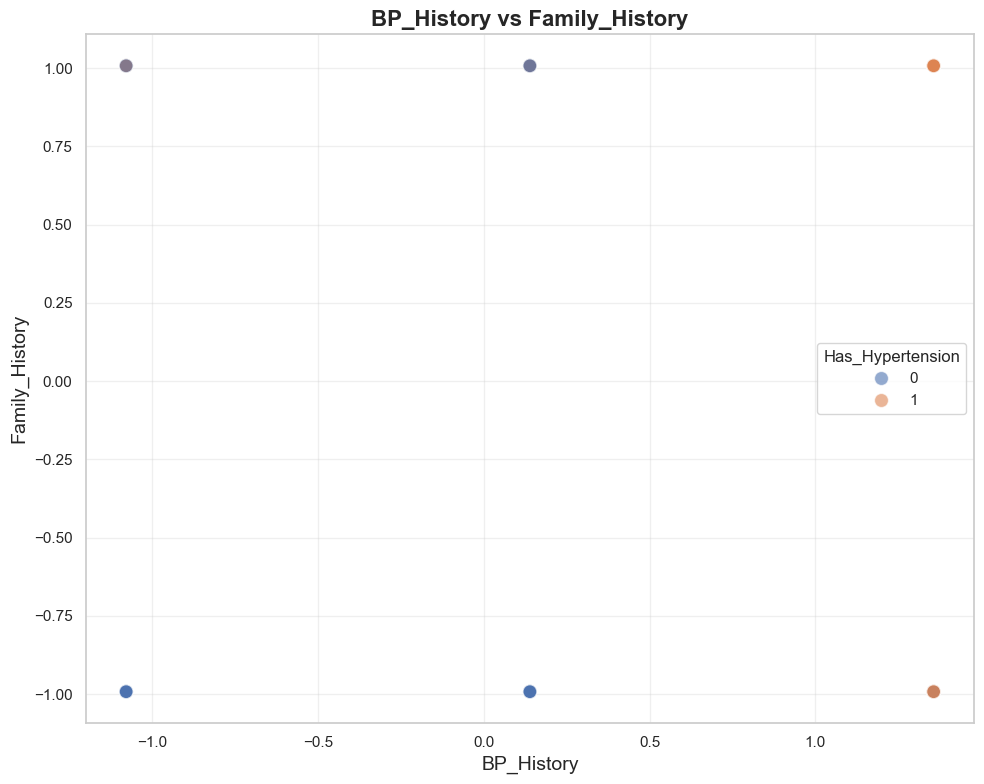

Showing plot 28/45: BP_History vs Family_History



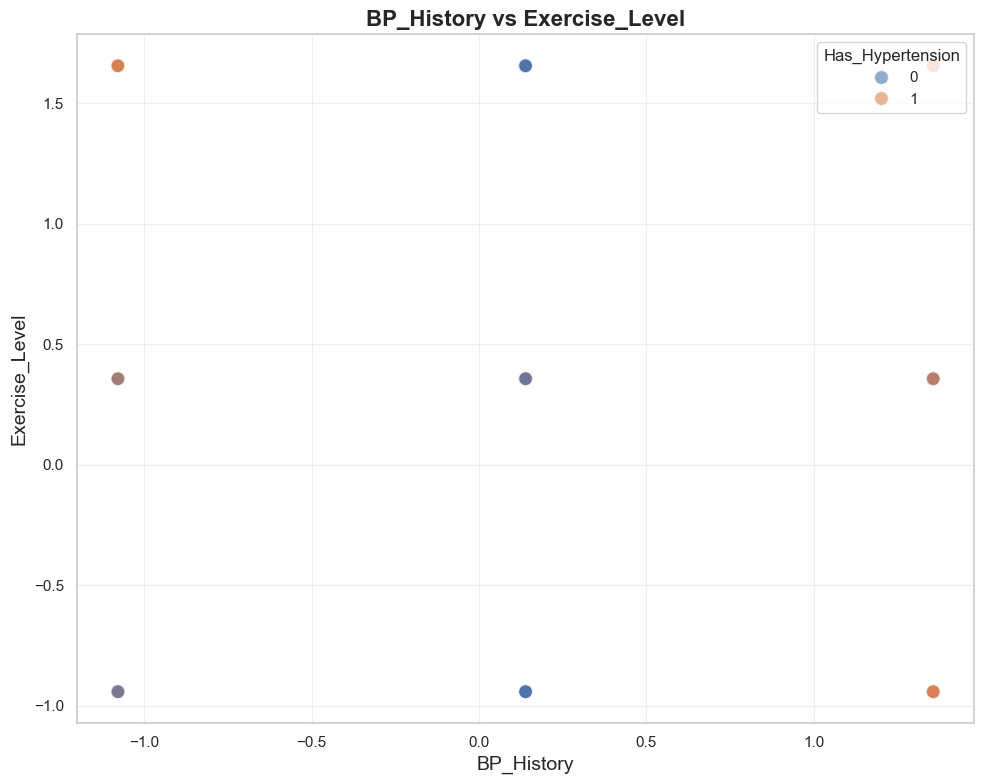

Showing plot 29/45: BP_History vs Exercise_Level



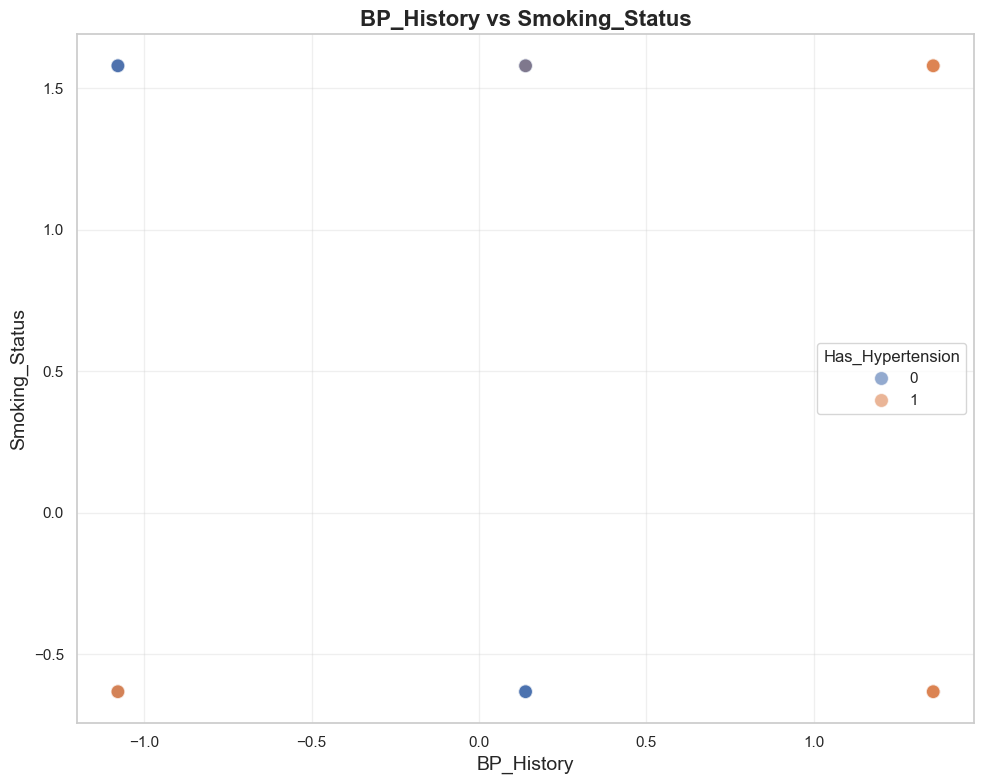

Showing plot 30/45: BP_History vs Smoking_Status



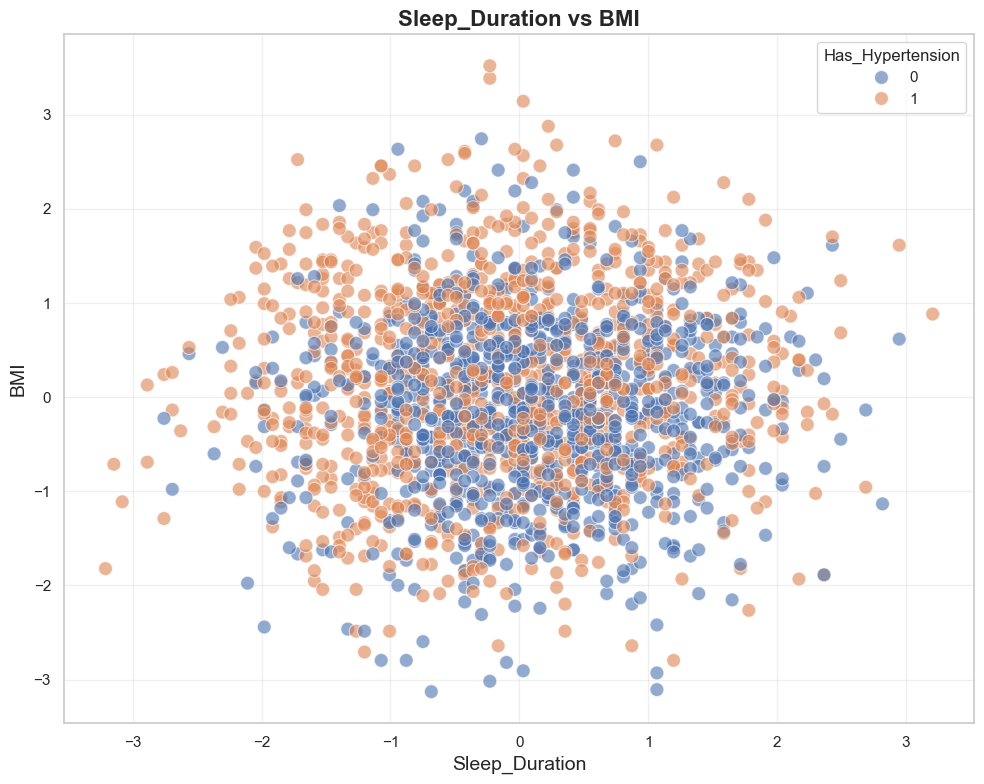

Showing plot 31/45: Sleep_Duration vs BMI



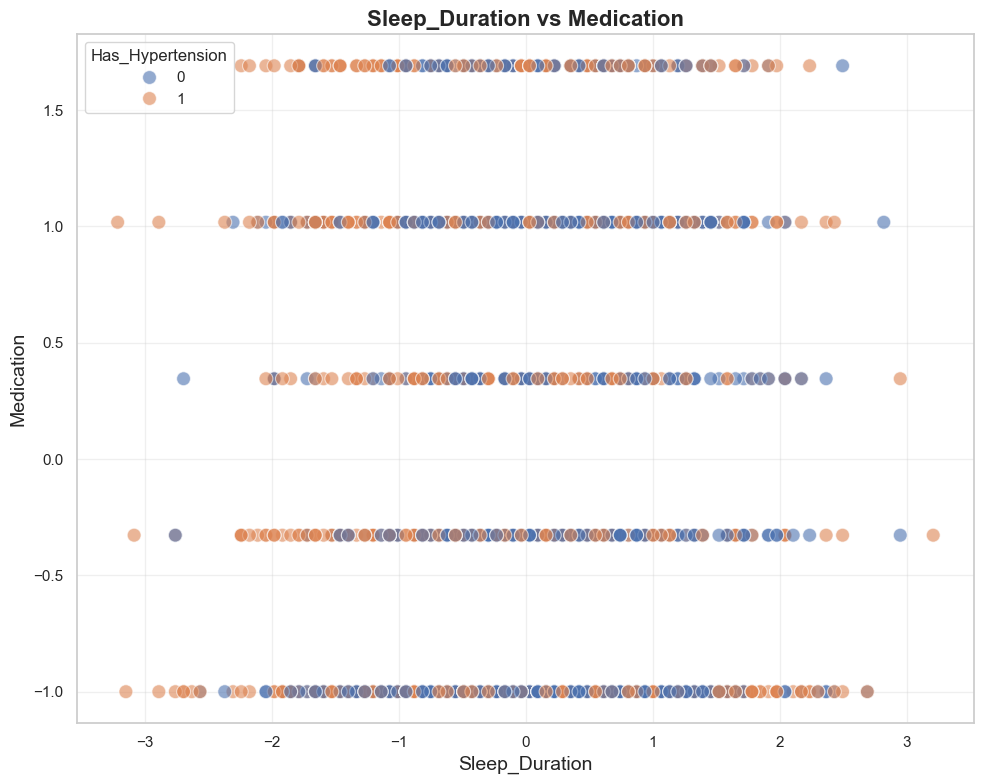

Showing plot 32/45: Sleep_Duration vs Medication



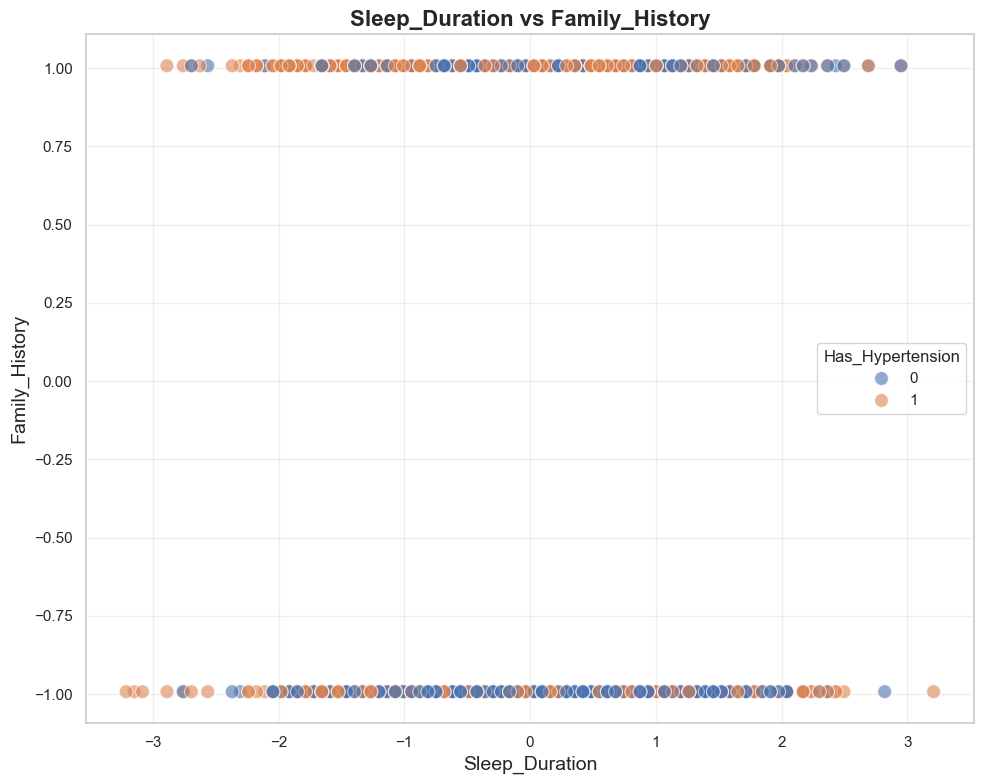

Showing plot 33/45: Sleep_Duration vs Family_History



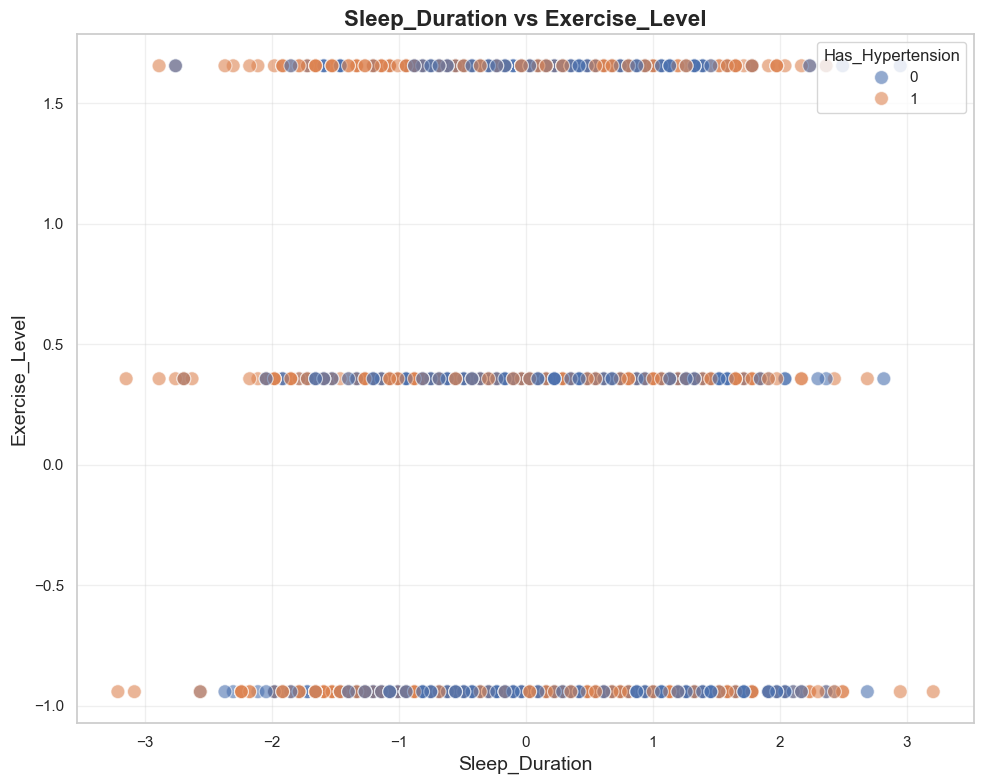

Showing plot 34/45: Sleep_Duration vs Exercise_Level



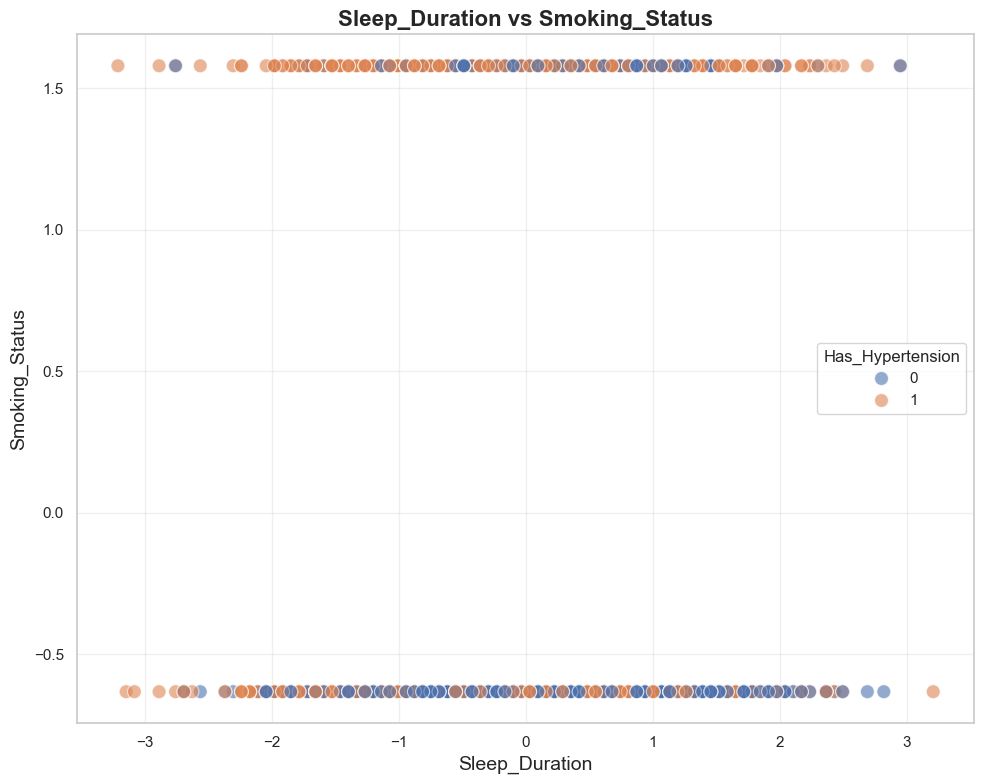

Showing plot 35/45: Sleep_Duration vs Smoking_Status



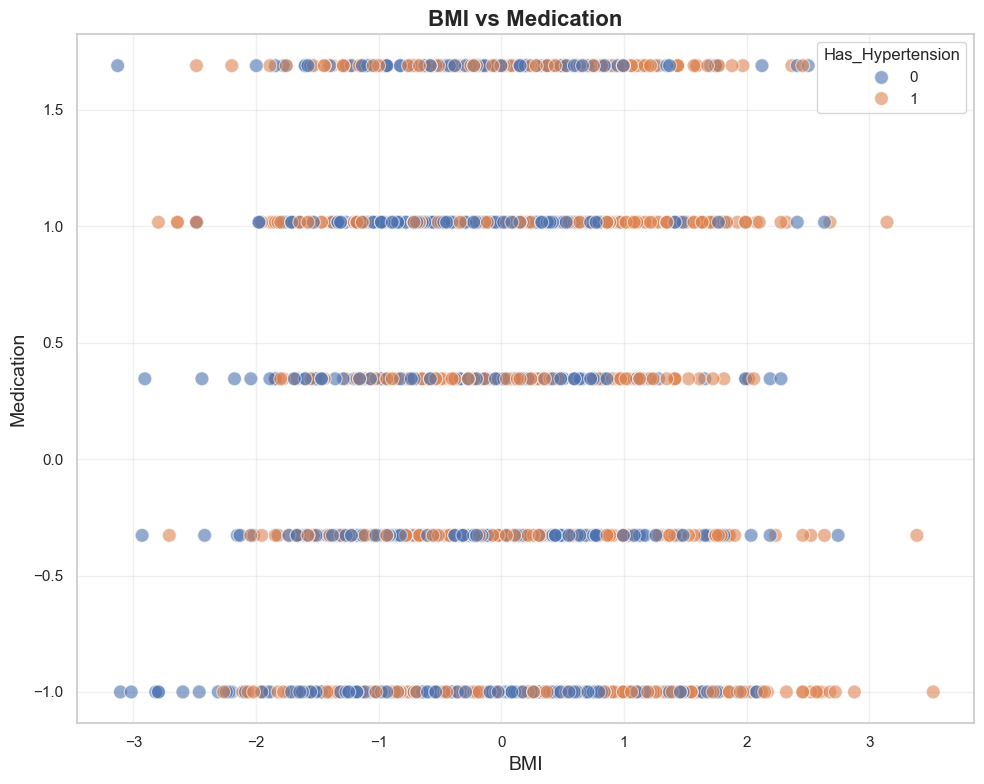

Showing plot 36/45: BMI vs Medication



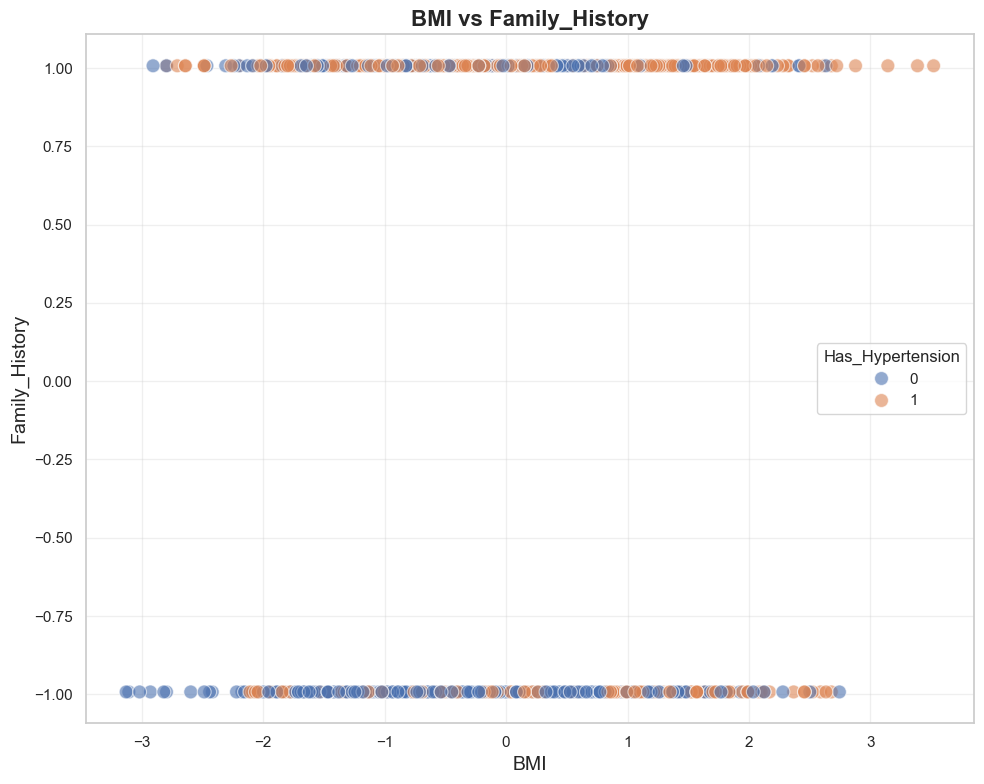

Showing plot 37/45: BMI vs Family_History



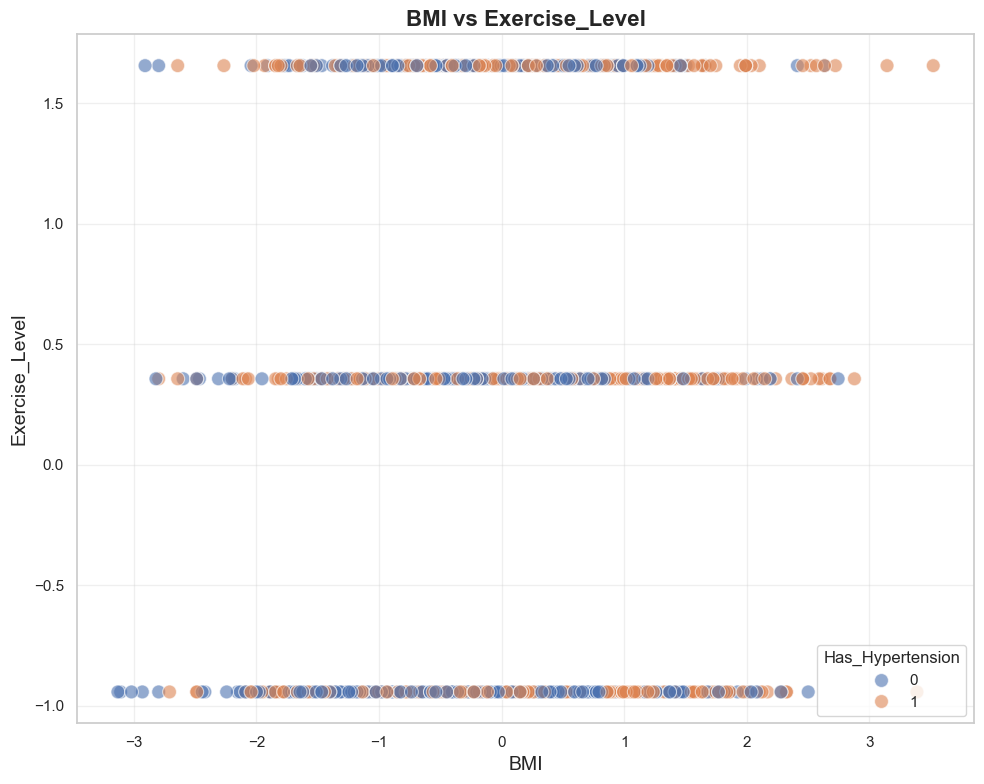

Showing plot 38/45: BMI vs Exercise_Level



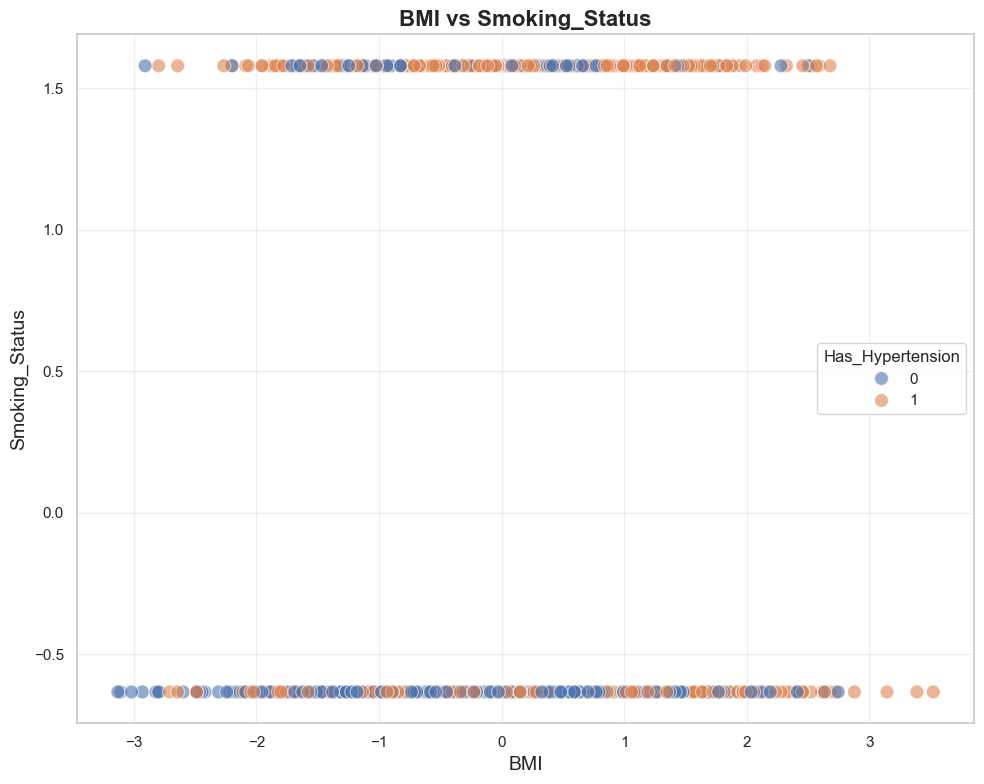

Showing plot 39/45: BMI vs Smoking_Status



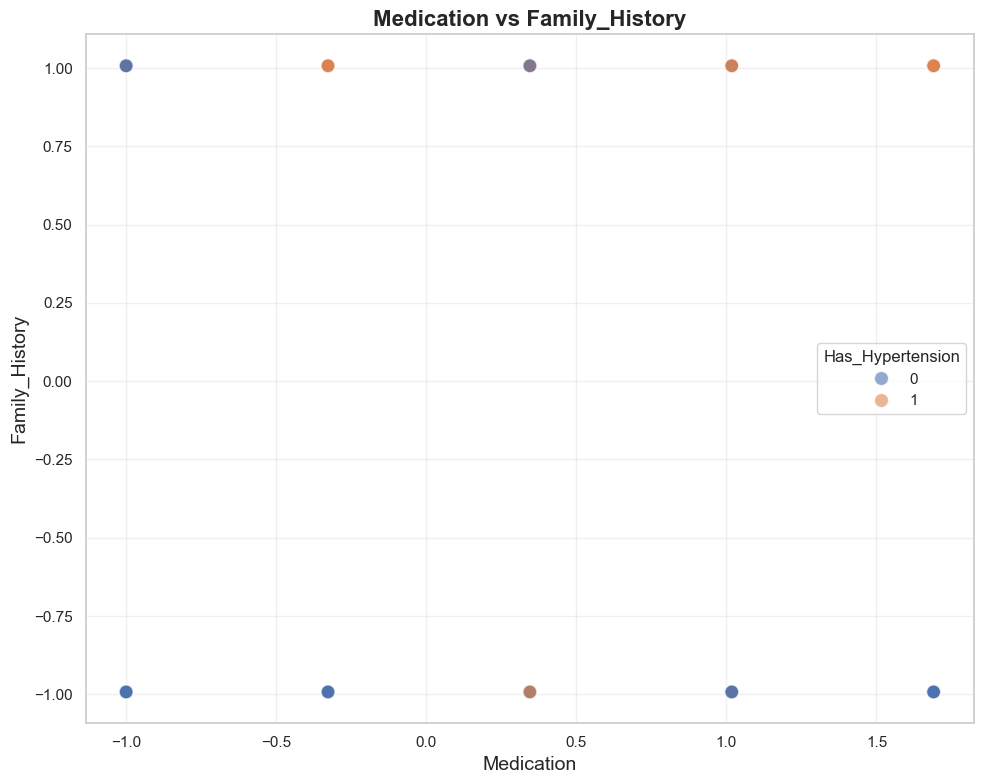

Showing plot 40/45: Medication vs Family_History



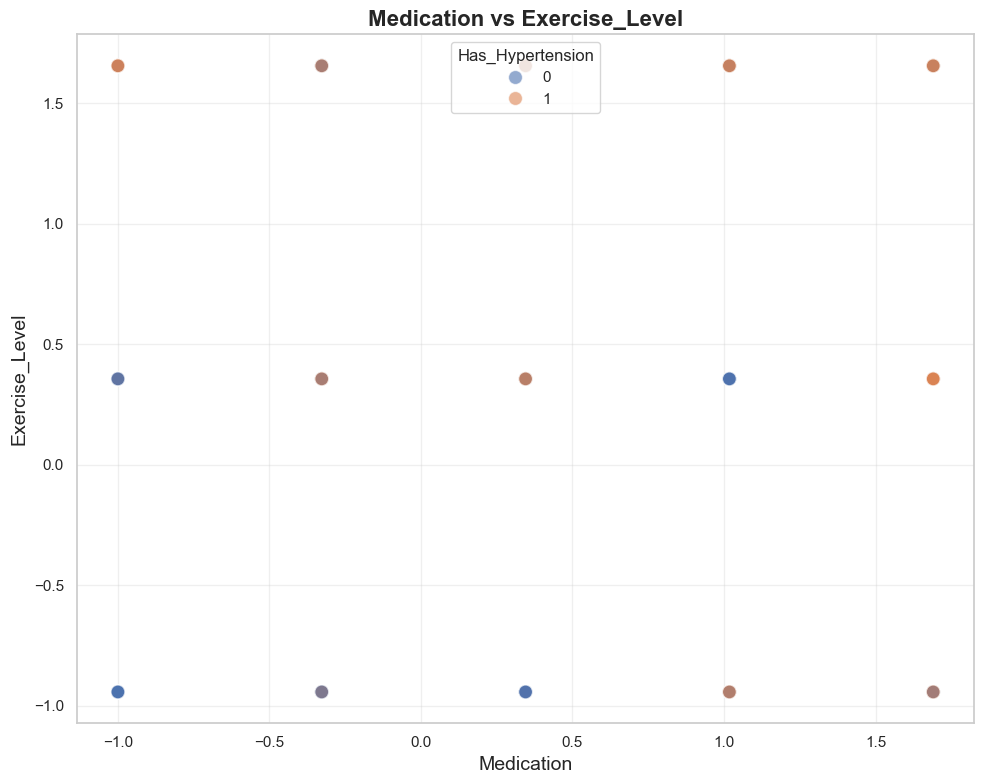

Showing plot 41/45: Medication vs Exercise_Level



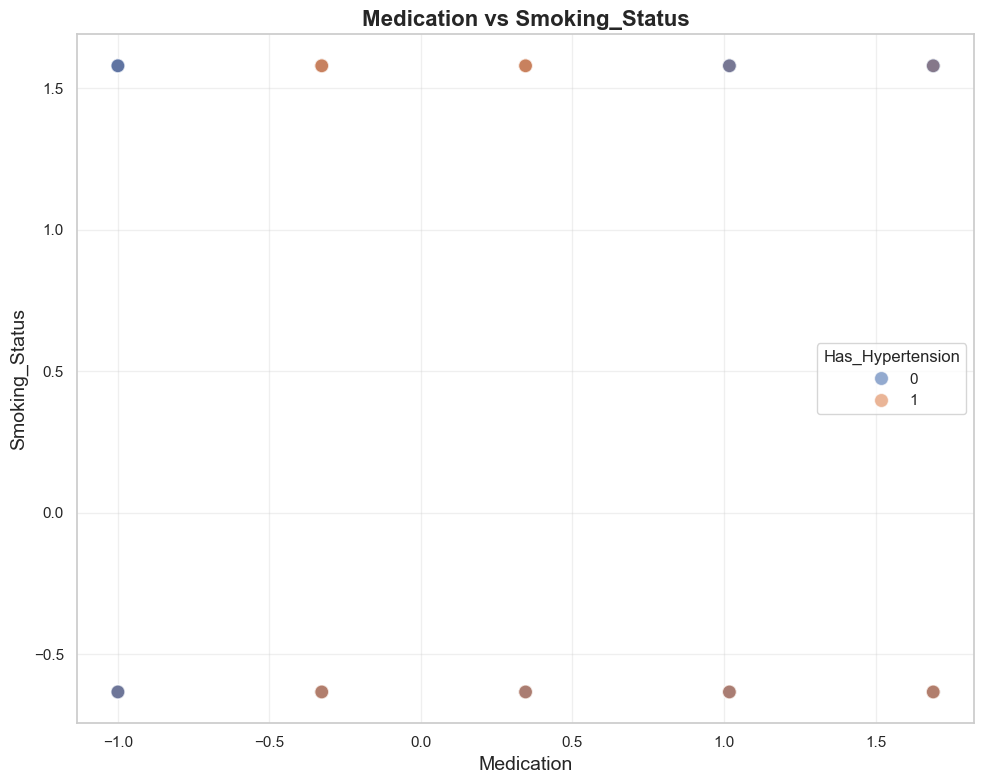

Showing plot 42/45: Medication vs Smoking_Status



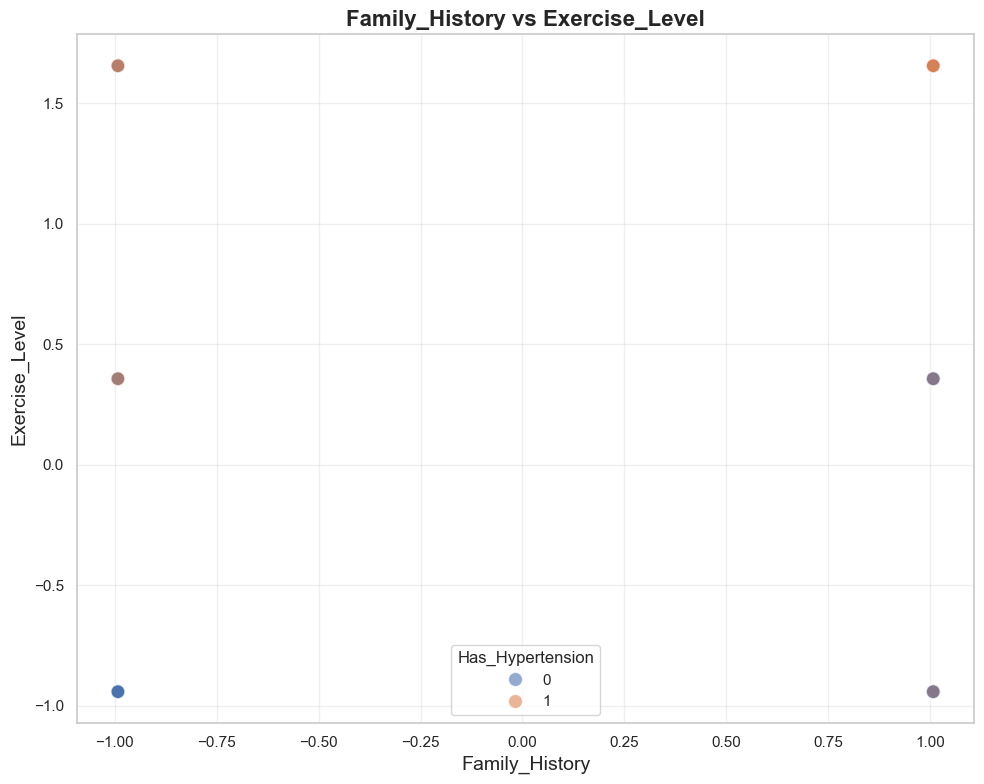

Showing plot 43/45: Family_History vs Exercise_Level



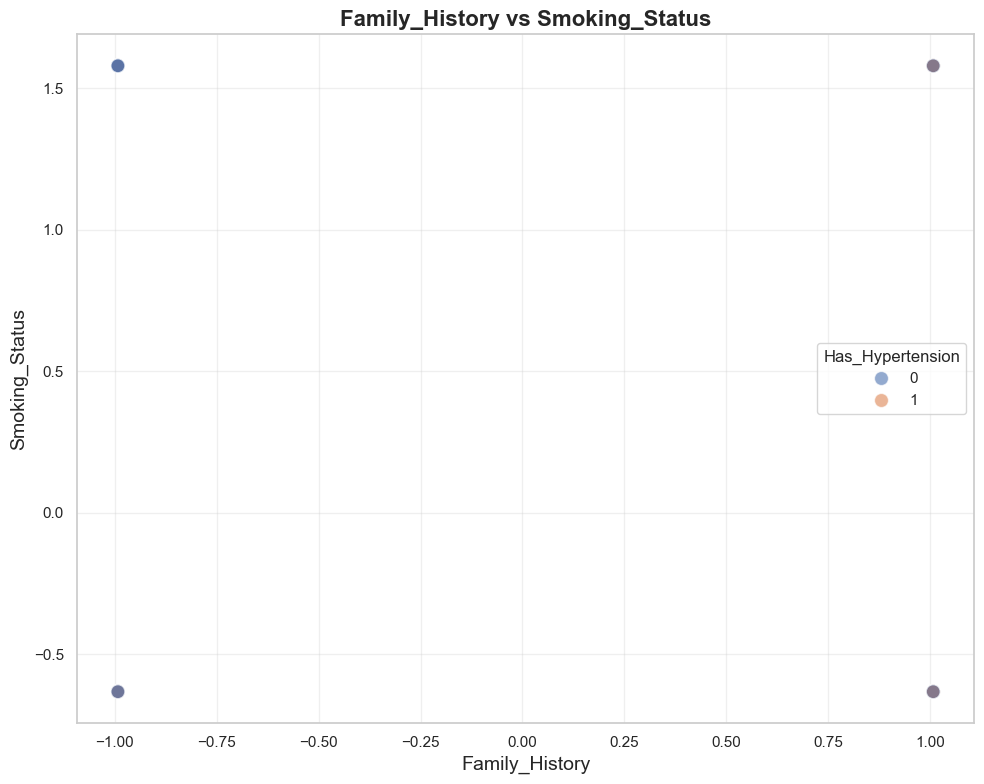

Showing plot 44/45: Family_History vs Smoking_Status



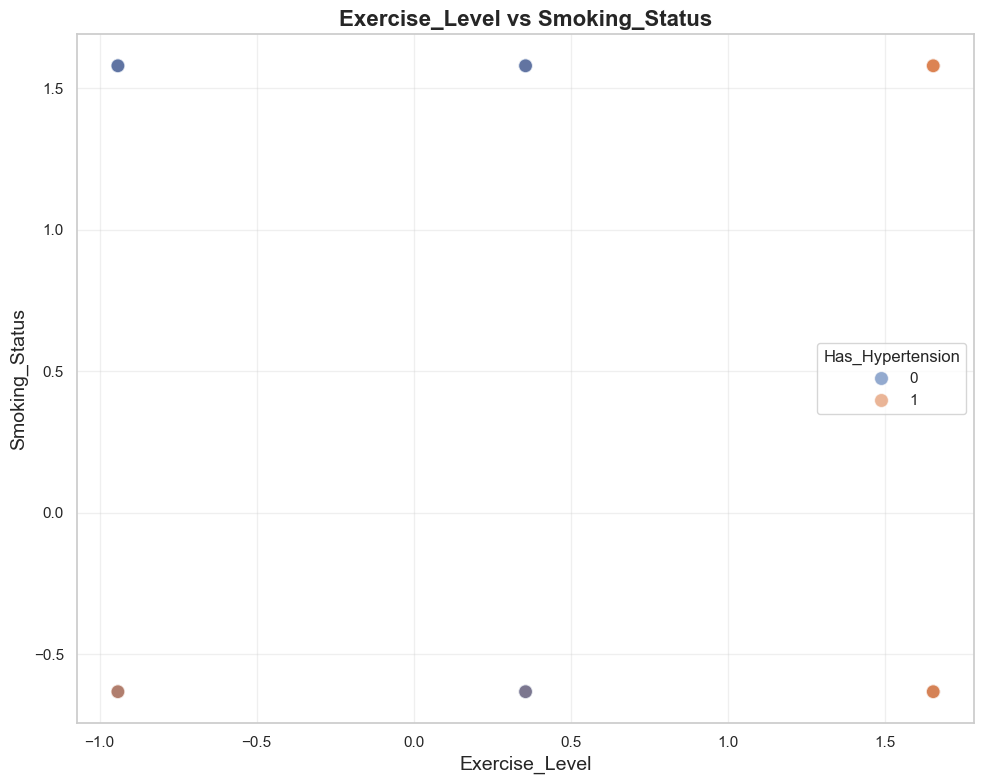

Showing plot 45/45: Exercise_Level vs Smoking_Status



In [168]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

# Get numeric columns (excluding hue if it exists)
plot_cols = [col for col in valid_numeric_cols if col != hue_col]

# Create individual plots for each pair
pairs = list(combinations(plot_cols, 2))

for i, (col1, col2) in enumerate(pairs):
    plt.figure(figsize=(10, 8))  # Large figure size
    
    if hue_col:
        sns.scatterplot(data=df, x=col1, y=col2, hue=hue_col, alpha=0.6, s=100)
    else:
        sns.scatterplot(data=df, x=col1, y=col2, alpha=0.6, s=100)
    
    plt.title(f'{col1} vs {col2}', fontsize=16, fontweight='bold')
    plt.xlabel(col1, fontsize=14)
    plt.ylabel(col2, fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"Showing plot {i+1}/{len(pairs)}: {col1} vs {col2}\n")

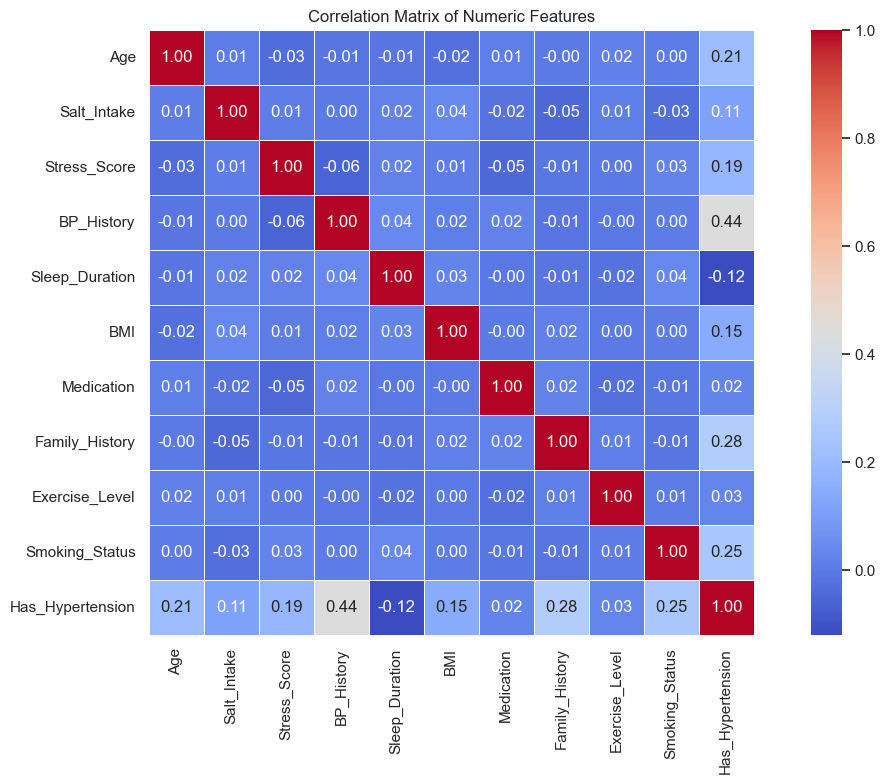

In [169]:
# Select numeric columns only
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# Compute correlation matrix
corr_matrix = numeric_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, square=True)
plt.title("Correlation Matrix of Numeric Features")
plt.tight_layout()
plt.show()